## Projekt na kurs Równania Różniczkowe w Technice
**Autorzy** : Alicja Myśliwiec, Natalia Lach,<br>
Matematyka Stosowana, Politechnika Wrocławska<br>
**Temat**: Krzywe Pościgowe

**Ważne moduły do zaimportowania:**

In [1]:
using Plots
using DifferentialEquations
using LinearAlgebra
using Luxor
using Colors

W sytuacji nie posiadania pewnego modułu należy go pobrać w następujący sposób:

In [2]:
#using Pkg
#Pkg.add("Colors")

____________

# KRZYWE POŚCIGOWE

## SPIS TREŚCI:
* [Wstęp](#wstep)
* [Notka historyczna](#his)
* [Metody numeryczne](#m_n)
* [Algorytm znajdowania krzywych pościgowych ](#alg)
    * [Proste krzywe pogoni](#prosta)
        * [Wyprowadzenie wzoru ogólnego](#pr_wypr)
        * [Analiza sytuacji dla $k=1$](#k1)
        * [Warunek dogonienia celu](#dogonienie_proste)
        * [Miejsce spotkania](#miejsce_proste)
    * [Sparametryzowane krzywe pogoni](#nie-prosta)
        * [Wyprowadzenie wzoru ogólnego](#param_wypr)
        * [Ucieczka po okręgu](#okrag)
            * [Wyprowadzenie wzoru](#okr_wypr)
            * [Analiza stałych](#RK)
        * [Inne przykłady krzywych pościgowych sparametryzowanych](#przyklady1)
    * [Krzywe w układzie trzech współrzędnych](#3D)
        * [Wzór ogólny](#wypr_3D)
        * [Ruch po helisie](#helisa)
        * [Inne przykłady](#przyklady2)
* [Mice Problem](#mice)
    * [Zadanie o 4 pająkach](#pajak)
    * [Prosta wizualizacja](#turtle)
    * [Wyprowadzenie ogólne](#miceall)
    * [Porównanie wyników zadania z wyprowadzeniem](#por_oba)
* [Podsumowanie](#podsumowanie)
* [Bibliografia](#bib)

## Wstęp <a class="anchor" id="wstep"></a>

Celem pracy jest przedstawienie i omówienie pojęcia `Krzywych pościgowych`. Są to krzywe opisujące ruch punktu 'ścigającego' pewien punkt 'ścigany'. Opis ten zazwyczaj jest dość trudny, jednak technicznych zastosowań mu nie brakuje. W lotnictwie np. zostały one wykorzystane do naprowadzania pocisków na cel [[1]](#bib), co ma duże znaczenie dla działań wojskowych. Zostaną pokazane analityczne wyprowadzenia oraz wizualizacje omawianych zagadnień, również z uwzględnieniem przestrzeni $ \mathbb{R}^3$. W projekcie również zostaną użyte i porównane dwie [metody numeryczne](#m_n), które wyznaczą rozwiązania równań różniczkowych typu $y'=f(x,y)$. Zostanie również opisany tzw. $\textit{'Mice Problem'}$ z przykładem oraz ogólnym wyprowadzeniem równań.

## Notka historyczna <a class="anchor" id="his"></a>

Pierwsze wzmianki o problemie pogoni sięgają czasów renesansu. Najprawdopodniej, to $\textit{Leonardo Da Vinci}$ jako jeden z pierwszych pochylił się nad zagadnieniem i koncepcją krzywych pościgowych. [[2]](#bib) W 1732r. francuski uczony $\textit{Pierre Bourger}$ podjął się znalezienia ścieżki, którą będzie podążał statek piracki goniący inny statek - poruszający się w linii prostej. Nad jego rozwiązaniem nieco później pochylił się inny francuski uczony $\textit{Pierre Louis Maupertuis}$. Skupił się on jednak na różnorodności drogi ucieczki i nie ograniczał się jedynie do tych, będących linią prostą. Rozważania obu Panów zostały przedstawione w 1735r. w wydaniu *Histoire de l'Académie des sciences*. [[3]](#bib) Jednakże, to $\textit{George Boole}$ w 1859r. sformułował znane dziś pojęcie `Krzywych Pościgowych` w swojej pracy pt. *Treatise on differential equations*. [[4]](#bib) 

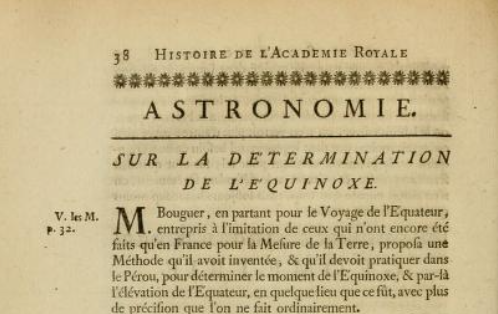<br>
<p style='text-align: center;'> Fragment $\textit{'Histoire de l'Académie des sciences' 1735r.}$ [5] </p>

## Metody numeryczne <a class="anchor" id="m_n"></a>

Załóżmy, że mamy równanie rózniczkowe zwyczajne pierwszego rzędu postaci $y'=f(x,y)$ oraz dany warunek początkowy $y(x_{0})=y_{0}$.<br>
Niech $h$ będzie dowolną dodatnią liczbą, która posłuży za wielkość kroku całkowania - dokładność obliczeń.<br> <br>

>#### Algorytm Rungego-Kutty 4-tego rzędu<br>

Iteracyjny wzór na y według metody Rungego-Kutty 4. rzędu jest postaci
$$y_{n+1} = y_{n}+\Delta y_{n},$$
gdzie $$\Delta y_{n} = \frac{1}{6}(k_1+2k_2+2k_3+k_4)$$ oraz  
$$\begin{align}
k_1 &= hf(x_n,y_n), \\
k_2 &= hf\left( x_n + \frac{h}{2},y_n + \frac{k_1}{2}\right), \\
k_3 &= hf\left( x_n + \frac{h}{2},y_n + \frac{k_2}{2}\right), \\
k_4 &= hf( x_n + h,y_n + k_3).
\end{align}$$ <br> <br>

>#### Metoda Eulera (metoda siecznych) <br>

Iteracyjny wzór na $y$ według metody Eulera jest postaci
$$y_{n+1} = y_{n}+hf(x_n,y_n).$$

## Algorytm znajdowania krzywych pościgowych <a class="anchor" id="alg"></a>
____________

## Proste krzywe pogoni  <a class="anchor" id="prosta"></a> 

### Wyprowadzenie wzoru ogólnego <a class="anchor" id="pr_wypr"></a>

Najprostszym przypadkiem krzywych pościgowych jest sytuacja, w której cel porusza się po pewnej prostej ze stałą prędkością. <br>
Załóżmy zatem, że para $(x,y)$ określa położenie pewnego punktu $A$ w układzie współrzędnych w czasie $t$. Niech w czasie $t = 0$ znajduje się on w punkcie $(0,0)$ oraz niech porusza się ze stałą prędkością $\alpha$. Teraz, niech punkt $B$ będzie jego celem. $B$ wyrusza z punktu $(x_{0},0)$ ze stałą prędkością $\beta$.<br>
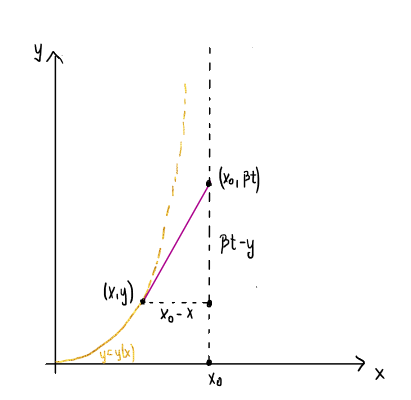<br>
Goniący punkt $A$, zawsze porusza się w stronę uciekającego punktu $B$, co oznacza, że wektor prędkości $A$ jest skierowany bezposrednio do $B$ przez cały czas trwania pościgu.<br>
Naszym celem będzie znalezienie równania $y = y(x)$ określającego krzywą tego pościgu. [[6]](#bib) [[7]](#bib) <br>
Aby to zrobić, znajdziemy styczną do generowanej przez punkt $A$ krzywej pościgu. Punkt $A$ w czasie $t$ znajduje się w $(x,y)$ a punkt $B$ w $(x_{0},\beta t)$. Zatem nachylenie stycznej wyraża się poprzez równanie<br> 
$$\frac{dy}{dx}=\frac{\beta t - y}{x_{0}-x}.$$
Wyliczamy z niego $t$.
$$\frac{dy}{dx}(x_{0}-x)+y=\beta t$$
$$t=\frac{y+\frac{dy}{dx}(x_{0}-x)}{\beta}$$

Wiemy także, że w czasie $t$ punkt $A$ zdążył przebyć pewną trasę, ktorej długość możemy wyliczyć, korzystając ze wzoru na długość łuku z analizy wektorowej.
$$\alpha t = \int_{0}^x \sqrt{1 + {\left( \frac{dy}{dz}\right) }^2 }dz$$
Ponownie znajdujemy $t$.
$$t = \frac{1}{\alpha}\int_{0}^x \sqrt{1 + {\left( \frac{dy}{dz}\right) }^2 }dz$$
Porównujemy teraz wyprowadzone przez nas równania na $t$ i otrzymujemy 
$$\frac{1}{\alpha}\int_{0}^x \sqrt{1 + {\left( \frac{dy}{dz}\right) }^2 }dz = \frac{1}{\beta} \left(y+\frac{dy}{dx}(x_{0}-x)\right).$$ 
Teraz, aby rozwiązać to równanie różniczkowe zastosujemy podstawienie $p(x)=\frac{dy}{dx}$.
$$\frac{\beta}{\alpha}\int_{0}^x \sqrt{1 + {p(z)}^2 }dz = y+p(x)(x_{0}-x)$$ 
Dla ułatwienia podstawmy także stałą $k=\frac{\beta}{\alpha}$ oraz zróżniczkujmy równanie po $dx$.
$$k\sqrt{1 + {p(x)}^2} = \frac{dy}{dx}+\frac{d(p(x)(x_{0}-x))}{dx}$$ 
Stosując zasady różniczkowania iloczynu oraz po ponownym podstawieniu $p(x)=\frac{dy}{dx}$ otrzymujemy
$$k\sqrt{1 + {p(x)}^2} = p(x) + \frac{dp}{dx}(x_{0}-x) - p(x).$$
Zatem po uporządkowaniu zostaje nam równanie różniczkowe pierwszego stopnia, które można rozwiązać metodą rozdzielenia zmiennych.
$$k\sqrt{1 + {p(x)}^2} =\frac{dp}{dx}(x_{0}-x)$$ <br>
$$-k\int\frac{dx}{x-x_{0}}=\int\frac{dp}{\sqrt{1 + {p(x)}^2}}$$
Całka z lewej strony jest całką elementarną, za to ta z prawej wymaga użycia wzoru $\int\frac{dx}{\sqrt{x^2+q}}=\ln{|x + \sqrt{x^2+q}|} + C$. Otrzymujemy
$$-k\ln{|x-x_{0}|}=\ln{|p(x) + \sqrt{1 + {p(x)}^2}|}+C.$$

Aby opuścić wartość bezwględną, w logarytmie z lewej strony musimy zmienić znak, gdyż zakładamy, że $0\leq x<x_{0}$. W logarytmie z prawej strony zakładamy, że $p(x)=\frac{dy}{dx}$ będzie zawsze dodatnie. Ostatecznie <br>
$$-k\ln{\left( x_{0}-x\right)}=\ln{\left( p(x) + \sqrt{1 + {p(x)}^2}\right)}+C.$$ 
W tym momencie możemy wyliczyć stałą C, biorąc za warunki początkowe $\frac{dy}{dx} = 0$ dla $t=0$. <br>
$$-k\ln{x_{0}} - \ln{1} = C$$ $$C = -k\ln{x_{0}}$$
Otrzymujemy zatem równanie, które porządkujemy przy pomocy działań elementarnych na logarytmach i rozwiązujemy. <br>
$$-k\ln{\left( x_{0}-x\right)}=\ln{\left( p(x) + \sqrt{1 + {p(x)}^2}\right)}-k\ln{x_{0}}$$ <br>
$$k\ln{\left( \frac{x_{0}}{x_{0}-x}\right) }=\ln{\left( p(x) + \sqrt{1 + {p(x)}^2}\right)}$$ <br>
$${\left( \frac{x_{0}}{x_{0}-x}\right) }^k = p(x) + \sqrt{1 + {p(x)}^2}$$ <br>
$${\left( \frac{x_{0}}{x_{0}-x}\right) }^k - p(x) = \sqrt{1 + {p(x)}^2}$$ <br>
$${\left( \frac{x_{0}}{x_{0}-x}\right) }^{2k} - 2p(x){\left( \frac{x_{0}}{x_{0}-x}\right) }^k + {p(x)}^2 = 1 + {p(x)}^2$$ <br>
$$p(x) = \frac{1}{2}\left( {\left( \frac{x_{0}}{x_{0}-x}\right) }^{2k}-1 \right)\frac{1}{{\left( \frac{x_{0}}{x_{0}-x}\right) }^{k}}$$ <br>
$$p(x) = \frac{1}{2}\left( {\left( \frac{x_{0}}{x_{0}-x}\right) }^{k}-{\left( \frac{x_{0}}{x_{0}-x}\right) }^{-k}\right) $$

 Teraz, należy tylko wrócić do wyjściowego podstawienia $p(x)=\frac{dy}{dx}$ i znaleźć szukane $y(x)$. 
 $$\frac{dy}{dx} = \frac{1}{2}\left( {\left( \frac{x_{0}}{x_{0}-x}\right) }^{k}-{\left( \frac{x_{0}}{x_{0}-x}\right) }^{-k}\right) $$
 $$\int{dy} = \frac{1}{2}\int{\left( {\left( \frac{x_{0}}{x_{0}-x}\right) }^{k}-{\left( \frac{x_{0}}{x_{0}-x}\right) }^{-k}\right)dx} $$
 Całka z lewej jest całką elementarną, zajmiemy się całką z prawej.
$$P = \frac{1}{2}\int{\left( {\left( \frac{x_{0}}{x_{0}-x}\right) }^{k}-{\left( \frac{x_{0}}{x_{0}-x}\right) }^{-k}\right)dx} = 
\frac{1}{2}\left({x_{0}}^k\int{{(x_{0}-x)}^{-k}dx}-{x_{0}}^{-k}\int{{(x_{0}-x)}^{k}dx}\right)=
\begin{vmatrix}
w = x_{0}-x\\
dw = -dx
\end{vmatrix} = $$
$$\frac{1}{2}\left( -{x_{0}}^k\int{{w}^{-k}dw}+{x_{0}}^{-k}\int{{w}^{k}dw}\right) = 
\frac{1}{2}\left( -{x_{0}}^k\frac{{w}^{-k+1}}{-k+1}+{x_{0}}^{-k}\frac{{w}^{k+1}}{k+1}\right) + C=
\frac{1}{2}\left( -{x_{0}}^k\frac{{(x_{0}-x)}^{-k+1}}{-k+1}+{x_{0}}^{-k}\frac{{(x_{0}-x)}^{k+1}}{k+1}\right) + C=$$
$$\frac{1}{2}(x_{0}-x)\left( -\frac{{x_{0}}^k{(x_{0}-x)}^{-k}}{-k+1}+\frac{{x_{0}}^{-k}{(x_{0}-x)}^{k}}{k+1}\right) + C=
\frac{1}{2}(x_{0}-x)\left({\left(\frac{x_{0}-x}{x_{0}}\right)}^{k}\frac{1}{k+1}-{\left(\frac{x_{0}}{x_{0}-x}\right)}^{k}\frac{1}{1-k}\right) + C
$$
Ostatecznie otrzymujemy zatem, że 
$$y(x) = \frac{1}{2}(x_{0}-x)\left({\left(\frac{x_{0}-x}{x_{0}}\right)}^{k}\frac{1}{k+1}-{\left(\frac{x_{0}}{x_{0}-x}\right)}^{k}\frac{1}{1-k}\right) + C
$$
Mamy jednak niewykorzystane warunki początkowe w formie punktu startowego $y(0)=0$. Podstawiamy.
$$y(0) = \frac{1}{2}x_{0}\left( \frac{1}{k+1} - \frac{1}{1-k}\right) +C = 0$$
$$C = -\frac{1}{2}x_{0}\frac{1-k-k-1}{1-k^2}= x_{0}\frac{k}{1-k^2}$$

Ostatecznie równanie prostej krzywej pościgu wyraża się wzorem
$$y(x) = \frac{1}{2}(x_{0}-x)\left({\left(\frac{x_{0}-x}{x_{0}}\right)}^{k}\frac{1}{k+1}-{\left(\frac{x_{0}}{x_{0}-x}\right)}^{k}\frac{1}{1-k}\right) + x_{0}\frac{k}{1-k^2},$$
gdzie $k=\frac{\beta}{\alpha}$ - stosunek prędkości punktów $B$ i $A$.

Przejdźmy do zilustrowania znalezionych krzywych pościgu.

In [51]:
f(x,x₀=5.0,k=1.1) = 1/2*(x₀-x)*(((x₀-x)/x₀)^k*1/(k+1)-(x₀/(x₀-x))^k*1/(1-k))+x₀*k/(1-k^2)

function proste(x₀=5,k=1.1) 
    g(x) = f(x,x₀,k)
    plot(g,0,10, title="k="*string(k))
    display(vline!([x₀]))
end

proste (generic function with 3 methods)

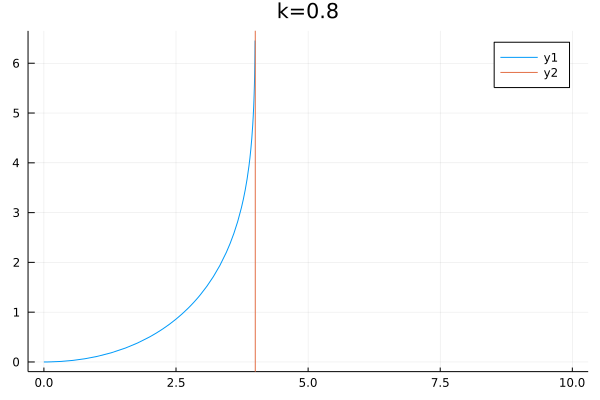

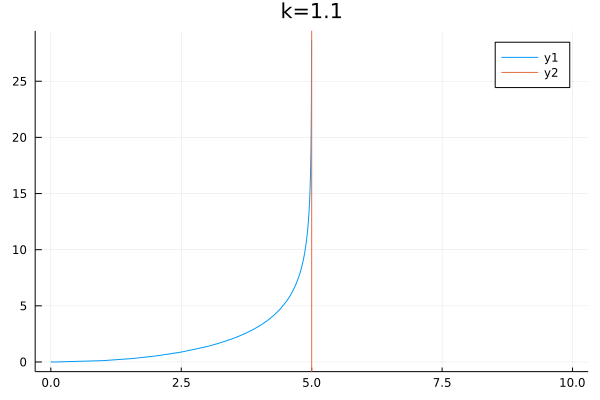

In [52]:
proste(4,0.8)
proste()

Porównanie wykresów dla róznych $k$ wygląda następująco.

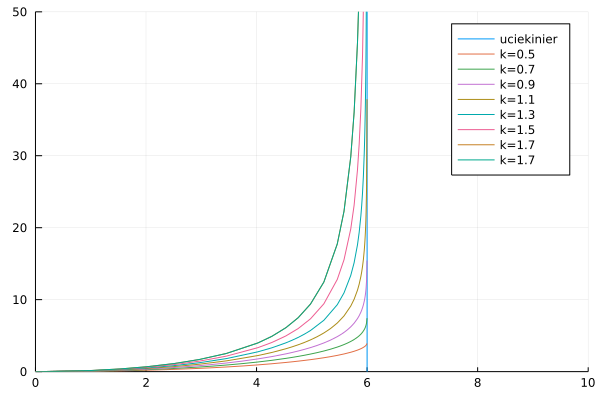

In [53]:
vline([6], label="uciekinier")
for k in 0.5:0.2:1.7
    h(x) = f(x,6,k)
    plot!(h,0,10, label="k="*string(k), xlim=(0,10), ylim=(0,50))
end
h(x) = f(x,6,1.7)
display(plot!(h,0,10, label="k=1.7"))

Sprawdźmy teraz poprawność naszych obliczeń, wykorzystując wyprowadzone wcześniej metody numeryczne Eulera oraz Rungego-Kutty i porównując wygenerowane nimi wykresy.<br>
Wychodzimy z równania różniczkowego pierwszego rzędu $$\frac{dy}{dx} = \frac{1}{2}\left( {\left( \frac{x_{0}}{x_{0}-x}\right) }^{k}-{\left( \frac{x_{0}}{x_{0}-x}\right) }^{-k}\right) $$.

In [54]:
g(x,y,x_0,k) = 1/2*((x_0/(x_0-x))^k-(x_0/(x_0-x))^(-k))

g (generic function with 1 method)

In [55]:
function RK(x_0, y_0, h, x_p, k, p = 100)
    ##bierzemy listy [x_0,x_1...] i [y_0,...], i dodajemy do nich kolejne wartosci
    ##x = x+h
    ##y = y + Dy ze wzoru RK4
    f(x,y) = g(x,y,x_p,k)
    x_n = last(x_0)
    y_n = last(y_0)
    k_1 = h*f(x_n, y_n)
    k_2 = h*f(x_n + h/2, y_n + k_1 / 2)
    k_3 = h*f(x_n + h/2, y_n + k_2 / 2)
    k_4 = h*f(x_n + h, y_n + k_3)
    y_n1 = y_n + (k_1 + 2*k_2 + 2*k_3 + k_4) / 6
    append!(x_0, x_n + h)
    append!(y_0, y_n1)
    if p == 1
        return x_0, y_0
    else
        RK(x_0, y_0, h, x_p, k, p-1)
    end

end

RK (generic function with 2 methods)

In [56]:
function Euler(x_0, y_0, h, x_p, k, p = 100)
    ##bierzemy listy [x_0,x_1...] i [y_0,...], i dodajemy do nich kolejne wartosci
    ##x = x+h
    ##y = y + Dy ze wzoru RK4
    f(x,y) = g(x,y,x_p,k)
    x_n = last(x_0)
    y_n = last(y_0)
    y_n1 = y_n + h*f(x_n,y_n)
    append!(x_0, x_n + h)
    append!(y_0, y_n1)
    if p == 1
        return x_0, y_0
    else
        Euler(x_0, y_0, h, x_p, k, p-1)
    end

end

Euler (generic function with 2 methods)

In [57]:
a = RK([0.0],[0.0],0.01, 3, 1.5, 295)
b = Euler([0.0],[0.0],0.01, 3, 1.5, 295)
h(x) = f(x,3,1.5)

h (generic function with 1 method)

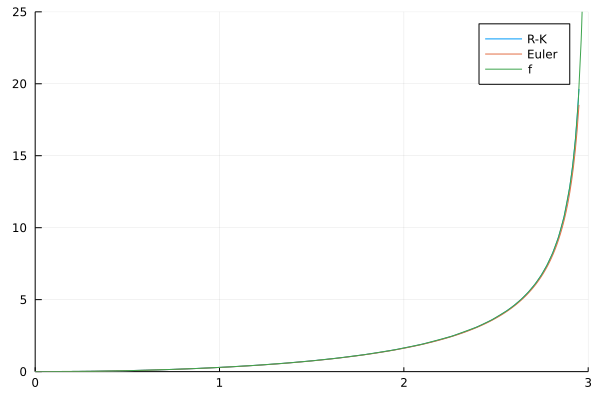

In [58]:
plot(a[1],a[2], xlim=(0,3),ylim=(0,25), label="R-K")
plot!(b[1],b[2], label="Euler")
plot!(h,0,3, label="f")

Jak widać, poprawnie wyznaczyliśmy wzór prostej krzywej pościgu. Metody numeryczne także dobrze sprawdziły się pod względem przybliżeń i braku odchyleń.<br>
Niestety, dokładniejsza analiza sytuacji będzie wymagała użycia innych metod, gdyż wyznaczanie wartości funkcji dla punktów zbliżających się do $x_0$ jest niezbyt dokładne (z uwagi na fakt, iż $\lim_{x\to x_0}f(x) = \infty$ ). <br>
Używając metody Rungego Kutty system nie jest w stanie wyznaczyć wartości już dla $301$ wykonań, gdyż przekracza ona maksymalną dozwoloną wartość liczbową.

In [59]:
#a2 = RK([0.0],[0.0],0.01, 3, 1.5, 301)

Zatem, aby wygenerować dokładniejsze wykresy i animacje wykorzystamy metody numeryczne Julii. Do ich realizacji wykorzystamy zależność opisującą ową sytuację pogoni, ale dla krzywych sparametryzowanych. <br>
Niech $H(t)$ będzie szukaną krzywą pościgu, a $R(t)$ będzie znaną nam krzywą ucieczki. Niech $\alpha$ będzie wartością prędkości uciekiniera, a $k$ - stosunkiem prędkości obu punktów. Wtedy krzywa pogoni goniącego $H(t)$ jest wyrażona poprzez równość 
$$H' = k\alpha\frac{R-H}{|R-H|}.$$ 
Jest to równość, która zostanie dokładnie przez nas wyprowadzona w kolejnych częściach projektu - [*Co by było gdyby cel uciekał po krzywej nie będącej prostą?*](#nie-prosta).<br>
Bez straty ogólności, przyjmiemy, że $\alpha=1$.<br>
Przykładowe zobrazowanie sytuacji dla $x_0=5$ i $k=1.2$ jest pokazane poniżej.

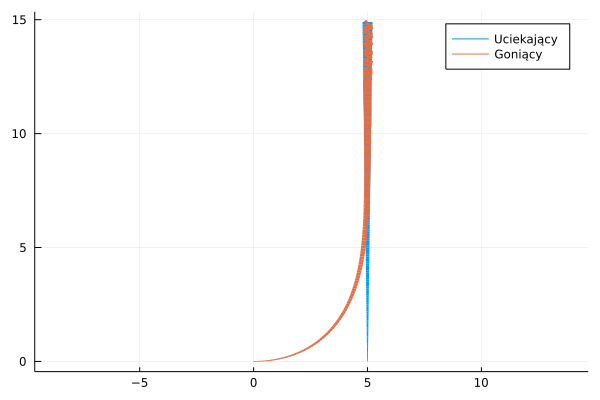

┌ Warning: Indices Base.OneTo(151) of attribute `linewidth` does not match data indices 1:150.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(151) of attribute `linewidth` does not match data indices 1:150.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108


In [6]:
using Plots, DifferentialEquations, LinearAlgebra

@userplot PursuitPlot
@recipe function f(cp::PursuitPlot)
    t, u = cp.args
    ##u jest postaci np [[5,0],[5,0.1]...]
    x = [u[i][1] for i in 1:1:length(u)-1]
    y = [u[i][2] for i in 1:1:length(u)-1]
    ##tworzymy listę x,y
    n = length(x) ##im dłuzsza lista x tym grubszy marker
    linewidth --> range(0.75, 10, length = n+1)
    aspect_ratio --> 1
    x, y
end


pursuit(u, k, t) = k * (pursued(t) - u) / norm(pursued(t)-u) ##ogólne równanie 
pursued(t) = [5, t] ##sparametryzowana krzywa ucieczki 
prob = ODEProblem(pursuit, [0.0, 0.0], (0.0, 15), 1.2) ##miejsce początkowe, ilość wykonań, stała k
sol = solve(prob, saveat=0.1);

pursuitplot(sol.t, pursued.(sol.t), label="Uciekający")
pursuitplot!(sol.t, sol.u, label="Goniący")

Stwórzmy ogólną funkcję, która generuje animacje ruchu po prostej krzywej pościgowej.

In [7]:
function animacje_proste(k,tim=10)
    anim = @animate for i = 1:0.1:tim
        prob = ODEProblem(pursuit, [0.0, 0.0], (0.0,i), k) 
        sol = solve(prob, saveat=0.1);

        pursuitplot(sol.t, pursued.(sol.t), label="uciekajacy", xlim=(0,10), ylim=(0,tim+5), title=k)
        pursuitplot!(sol.t, sol.u, label="goniacy")
    end

    gif(anim, "proste"*string(k)*".gif", fps = 10)
end

animacje_proste (generic function with 2 methods)

Przykładowa animacja dla $x_0 =3$ i $k=1.1$ .

In [27]:
pursued(t) = [3, t]
#animacje_proste(1.1)

pursued (generic function with 1 method)

<img src="animacje\3proste1_1.gif"/>


Teraz przedstawimy porównanie wykresów dla róznych wartości $k$ i $x_0=4$.

In [29]:
pursued(t) = [4, t]
#for k in 0.5:0.2:1.5
#    animacje_proste(k)
#end

pursued (generic function with 1 method)

<img src="animacje\proste0.5.gif"/> 
<img src="animacje\proste0.7.gif"/>
<img src="animacje\proste0.9.gif"/>
<img src="animacje\proste1.1.gif"/>
<img src="animacje\proste1.3.gif"/>
<img src="animacje\proste1.5.gif"/>

### Co by było gdyby $k=1$ ? <a class="anchor" id="k1"></a>
Analizując wykres i jego wyprowadzenie, musimy wziąć pod uwagę założenie, że działa on tylko dla $k\neq 1$. Zatem, jak wyglądałoby $y(x)$, gdyby $k = 1$?<br>
Wróćmy do momentu, w którym pierwszy raz pojawiło się założenie o $k\neq 1$, czyli przy rozwiązywaniu równania z pochodną $y'(x)$ takim, że $$\frac{dy}{dx} = \frac{1}{2}\left( {\left( \frac{x_{0}}{x_{0}-x}\right) }^{k}-{\left( \frac{x_{0}}{x_{0}-x}\right) }^{-k}\right). $$
Podstawmy do niego $k=1$.
$$\frac{dy}{dx} = \frac{1}{2}\left( {\left( \frac{x_{0}}{x_{0}-x}\right) }-{\left( \frac{x_{0}}{x_{0}-x}\right) }^{-1}\right) = 
\frac{1}{2}\left( {\left( \frac{x_{0}}{x_{0}-x}\right) }-{\left( \frac{x_{0}-x}{x_{0}}\right) }\right) =$$$$
\frac{1}{2}\frac{x_{0}^2-(x_0-x)^2}{x_0(x_{0}-x)} =
\frac{1}{2}\frac{x_{0}^2-x_0^2+2x_0x-x^2}{x_0(x_{0}-x)} =
\frac{1}{2x_0}\frac{2x_0x-x^2}{x_{0}-x} = 
\frac{1}{2x_0}\frac{x_0x + x_0x - x^2}{x_{0}-x} = 
\frac{1}{2x_0}\left( \frac{x_0x}{x_0-x} + x\right)  =$$$$
\frac{x}{2x_0} -\frac{1}{2}\frac{x-x_0+x_0}{x-x_0}  = 
\frac{x}{2x_0} - \frac{1}{2} -\frac{1}{2}\frac{x_0}{x-x_0} $$
Rozwiążmy podane równanie różniczkowe metodą rozdzielenia zmiennych.
$$\frac{dy}{dx} = \frac{x}{2x_0} - \frac{1}{2} -\frac{1}{2}\frac{x_0}{x-x_0}$$
$$2x_0\frac{dy}{dx} = x - x_0 -\frac{x_0^2}{x-x_0}$$
$$2x_0\int dy = \int (x - x_0 -\frac{x_0^2}{x-x_0})dx$$
$$2x_0\int dy = \int xdx - x_0\int dx -x_0^2\int \frac{1}{x-x_0}dx$$
$$2x_0 y = \frac{1}{2}x^2 - x_0x - x_0^2 \ln{|x-x_0|} + C$$

Weźmy teraz pod uwagę, że $x_0$ z założenia jest dodatnie, za to $x \in [0,x_0)$, dlatego należy zmienić znaki w logarytmie. Otrzymujemy 
$$y = \frac{1}{4x_0}x^2 - \frac{1}{2}x - \frac{x_0}{2} \ln{(x_0-x)} + C.$$
Podstawmy wyrażenie początkowe $y(0)=0$, aby znależć stałą $C$.
$$0 = 0 - 0 - \frac{x_0}{2} \ln{x_0} + C \Rightarrow C = \frac{x_0}{2} \ln{x_0} $$
Wstawiamy do równania i otrzymujemy ostateczną postać $y(x)$ dla $k=1$.
$$y = \frac{1}{4x_0}x^2 - \frac{1}{2}x - \frac{x_0}{2} \ln{(x_0-x)} + \frac{x_0}{2} \ln{x_0} = 
 \frac{1}{4x_0}x^2 - \frac{1}{2}x + \frac{x_0}{2} \ln{\frac{x_0}{x_0-x}} $$

Przykładowy wykres dla $x_0=5$.

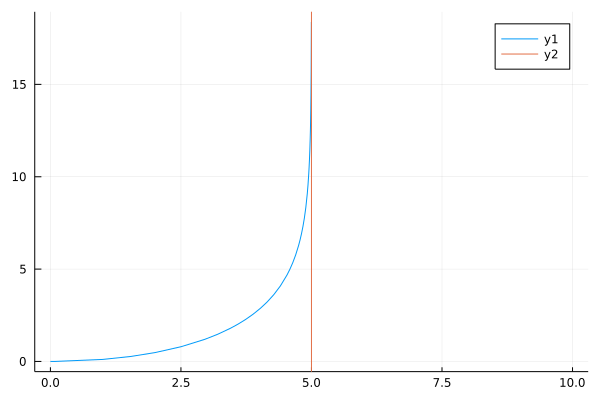

In [9]:
f(x,x₀)=1/4/x₀*x^2-1/2*x+x₀/2*log(x₀/(x₀-x))
r(x) = f(x,5)
plot(r,0,10)
vline!([5])

Ponownie korzystamy z wcześniej stworzonej metody, aby wygenerować animację dla $x_0=5$.

In [33]:
pursued(t) = [5, t]
#animacje_proste(1)

pursued (generic function with 1 method)

<img src="animacje\proste1.gif"/>

### Skąd wiadomo, że jeden dogoni drugiego? <a class="anchor" id="dogonienie_proste"></a>
<br>  [](#bib)
Aby odpowiedzieć na pytanie, czy goniący dogoni swój cel, musimy przeanalizować sytuację, gdy $x\to x_0$. Należy zatem policzyć granicę $\lim_{x\to x_0} y(x)$. Zaczniemy od przekształcenia wyrażenia na $y(x)$.
 [[8]](#bib) <br>
$$\begin{split}
y(x) & = \frac{1}{2}(x_{0}-x)\left({\left(\frac{x_{0}-x}{x_{0}}\right)}^{k}\frac{1}{k+1}-{\left(\frac{x_{0}}{x_{0}-x}\right)}^{k}\frac{1}{1-k}\right) + x_{0}\frac{k}{1-k^2} \\
 & = \frac{1}{2}(x_{0}-x)\left({\left(\frac{x_{0}-x}{x_{0}}\right)}^{k}\frac{1-k}{1-k^2}-{\left(\frac{x_{0}}{x_{0}-x}\right)}^{k}\frac{1+k}{1-k^2}\right) + x_{0}\frac{k}{1-k^2} \\
  & = \frac{x_0}{2}\frac{x_{0}-x}{x_0}\left({\left(\frac{x_{0}-x}{x_{0}}\right)}^{k}\frac{1-k}{1-k^2}-{\left(\frac{x_{0}}{x_{0}-x}\right)}^{k}\frac{1+k}{1-k^2}\right) + x_{0}\frac{k}{1-k^2} \\
  & = \frac{x_0}{2}\frac{1}{1-k^2}\left({\left(\frac{x_{0}-x}{x_{0}}\right)}^{1+k}(1-k)-{\left(\frac{x_{0}}{x_{0}-x}\right)}^{k-1}(1+k)\right) + x_{0}\frac{k}{1-k^2} \\
  & = \frac{x_0}{2}\frac{1}{1-k^2}\left({\left(\frac{x_{0}-x}{x_{0}}\right)}^{1+k}(1-k)-{\left(\frac{x_{0}-x}{x_{0}}\right)}^{1-k}(1+k) + 2k\right) \\
  & = \frac{kx_0}{2(1-k^2)}\left({\left(1-\frac{x}{x_{0}}\right)}^{1+k}\frac{1-k}{k}-{\left(1-\frac{x}{x_{0}}\right)}^{1-k}\frac{1+k}{k}+ 2\right)
 \end{split}$$<br>
Teraz zauważmy, że gdy podstawimy $x=x_0$, wyrażenie $1-\frac{x}{x_0}$ będzie równe zeru. Jednak trzeba uważać na potęgi, do których są podniesione oba nawiasy, gdyż mogą nam one odwrócić ułamek.<br> <br>
Można zauważyć, że dla $k<1$ $$\lim_{x\to x_0} y(x) = \frac{kx_0}{2(1-k^2)}\left( 2 + 0 + 0\right) = \frac{kx_0}{1-k^2},$$ <br> zatem granica jest skończona. <br> <br>
Jednakże, dla $k>1$ granica będzie nieskończona  $$\lim_{x\to x_0} y(x) = \frac{kx_0}{2(1-k^2)}\left( 2 + 0 + \left[ \frac{const}{0} \right] \right)=\infty.$$<br>
Zanalizujmy teraz sytuację i otrzymane wyniki.<br>
Nasz uciekinier porusza się po prostej pionowej $x=x_0$, która jest asymptotą. Z definicji asymptoty wynika jasno, że  $\lim_{x\to x_0} f(x) = \infty$, zatem jeśli celem goniącego jest dogonienie uciekiniera to musi on ostatecznie wejść na linię tejże asymptoty, a więc i granica jego ścieżki poruszania się przy $x \to x_0$ musi wynieść $\infty$. <br>
Oznacza to, że goniący dogoni swój cel wtedy, gdy ***k > 1***.

Rozważmy teraz osobny przypadek, gdy $k=1$. <br>
Granica $$\lim_{x\to x_0}(\frac{1}{4x_0}x^2 - \frac{1}{2}x + \frac{x_0}{2} \ln{\frac{x_0}{x_0-x}}) = \infty ,$$<br> czyli goniący teoretycznie w którymś momencie "wyląduje" na asymptocie. <br>
Zauważmy jednak, że przy $k = 1$, nawet jeśli oba punkty usytuują się na jednej prostej, to goniący nie zmniejszy odległości między nim a celem, bo poruszają się oni z tą samą prędkością. <br> <br>
Sytuację świetnie obrazuje animacja.

In [35]:
pursued(t) = [6, t]
#animacje_proste(1,20)

pursued (generic function with 1 method)

<img src="animacje\proste1_20.gif"/>

Mimo wszystko, żeby rzeczywiście pokazać, że nigdy się nie dogonią, zanalizujmy jak zmieniają się odleglości goniącego od celu w czasie trwania ruchu.

[5.0, 4.901006631578423, 4.80405274301983, 4.709176863745128, 4.6164162748986675, 4.52580674877818, 4.43738234594039, 4.351175156572315, 4.2672148924755255, 4.185528692549378, 4.1061409251529035, 4.029072590166738, 3.954341825576697, 3.8819631532813212, 3.8119467308976844, 3.7442983895085886, 3.679019689683932, 3.6161079978407935, 3.5555562288584217, 3.49735124164948, 3.4414777253492455, 3.3879149158087096, 3.3366362635856417, 3.287609919519373, 3.2407992724509342, 3.1961635349108217, 3.1536583714951667, 3.1132365636785844, 3.0748475399540323, 3.0384344037571465, 3.003940644044797, 2.9713068923379167, 2.940470958848863, 2.9113684168998315, 2.8839332037765555, 2.858098229343598, 2.833795983868069, 2.8109591368593856, 2.789521119308305, 2.769416682465466, 2.7505823801916365, 2.73295447755014, 2.7164683854773184, 2.701061676846444, 2.686674209876244, 2.673248143601217, 2.6607279404675577, 2.6490603562072508, 2.63819441729332, 2.6280813864116195, 2.6186747164991084, 2.609929993995849, 2.60

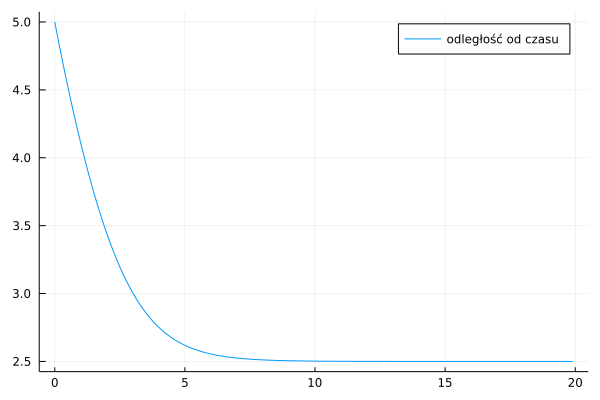

In [40]:
pursued(t) = [5, t]
prob = ODEProblem(pursuit, [0.0, 0.0], (0.0,50), 1) 
sol = solve(prob, saveat=0.1);

pursuitplot(sol.t, pursued.(sol.t), label="Rabbit")
pursuitplot!(sol.t, sol.u, label="Fox")


odl = [sqrt((sol.u[i][1]-pursued.(sol.t)[i][1])^2 + (sol.u[i][2]-pursued.(sol.t)[i][2])^2) for i in 1:1:200]
t = [i for i in 0:0.1:19.9]
print(odl[1:150])
plot(t, odl, label="odległość od czasu")

Łatwo zauważyć, że od pewnego momentu odległość między goniącym a uciekinierem zaczyna się stabilizować, co potwierdza naszą hipotezę. Przykładowo, dla $x_0 = 5$ ustala się ona na poziomie mniej więcej $2.5$ (czyli goniący zmniejszył swoją odległość o połowę, co niestety nie wystarczyło).<br><br>

##### Ostateczny wniosek jest zatem taki, że aby goniący złapał swój cel stosunek jego prędkości do prędkości uciekiniera musi być większy od $1$, czyli $k>1$.

### Skoro się spotkają, to kiedy? <a class="anchor" id="miejsce_proste"></a>
Skoro już wiemy, że goniący złapie swój cel dla pewnych wartości $k$, to czas teraz wyznaczyć czas i  miejsce spotkania. Z racji tego, że próby znalezienia granicy przy $x\to x_0$ już z definicji kończą się na $\infty$, wyznaczenie bezpośrednie miejsca spotkania punktów jest bardzo ciężkie, o ile nie niemożliwe, zatem znajdziemy owe miejsce korzystając z analizy wykresów i przybliżeń. I tym razem skorzystamy z metod numerycznych i funkcji Julii. <br>
Stwórzmy funkcję, która sprawdza odległości między punktami i która znajdzie taki parametr, że odległość między punktami wyniesie wartość bliską zeru.

In [10]:
function meet(x₀, k, acc=0.01, lgth = 30) ##acc - accuracy czyli dokładnosc wyznaczenia miejsca spotkania
    pursued(t) = [x₀, t]
    prob = ODEProblem(pursuit, [0.0, 0.0], (0.0, lgth), k)
    sol = solve(prob, saveat=0.1);

    odl = [sqrt((sol.u[i][1]-pursued.(sol.t)[i][1])^2 + (sol.u[i][2]-pursued.(sol.t)[i][2])^2) for i in 1:1:lgth*10]
    t = [i for i in 0:0.1:(lgth-0.1)]
    display(plot(t,odl,label="odległość od czasu"))
    
    for i in 1:1:lgth*10
        if odl[i] < acc
            println("odl: ",odl[i])
            println("x: ",pursued.(sol.t)[i][1])
            println("y: ",pursued.(sol.t)[i][2])
            return
        end
    end
end


meet (generic function with 3 methods)

Przeanalizujmy przykład dla $x_0 = 3$ i $k = 1.5$.

In [14]:
pursued(t) = [3, t]
#animacje_proste(1.5)

pursued (generic function with 1 method)

<img src="animacje\3proste1.5.gif"/>

Z animacji wynika, że punkty dogonią się gdzieś między $y=4$ a $y=5$. Sprawdźmy wynik funkcji.

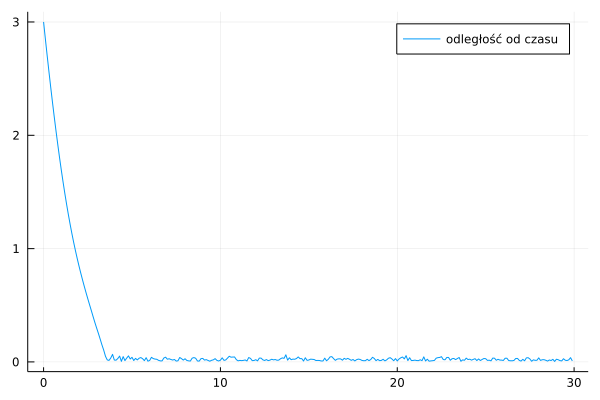

odl: 0.004906224166226158
x: 3.0
y: 4.4


In [15]:
meet(3,1.5)

Zauważmy, że wykres odległości nie jest już tak gładki, jak w przypadku analizy odległości dla $k=1$. Dzieje się tak dlatego, że gdy goniący dogoni już swój cel, aby dostosować się do jego toru ruchu, musi zacząć hamować. Wynika to z faktu, że posiada on większą prędkość w porównaniu do swojego celu. Goniący oscyluje wokół celu, a przez niedokładność funkcji i obliczeń na wykresie powstają nierówności. <br>
Z drugiej strony, dzięki temu mankamentowi można łatwo zauważyć moment spotkania obu punktów analizując sam wykres i tu znowu zauważamy, że spotkanie nastąpiło w przedziale $(4,5)$.<br>
Funkcja jednak przybliżyła owy moment i wyznaczyła go na $y=4.4$. Dlatego też spotkanie odbyło się w punkcie $(3, 4.4)$

Rozważmy kolejny przykład - $x_0 = 6$ i $k = 1.3$.

In [16]:
pursued(t) = [6, t]
#animacje_proste(1.4)

pursued (generic function with 1 method)

<img src="animacje\6proste1.4.gif"/>

Z animacji wynika, ze spotkają się gdzieś w okolicy $y=8$ i $y=9$. Sprawdźmy to.

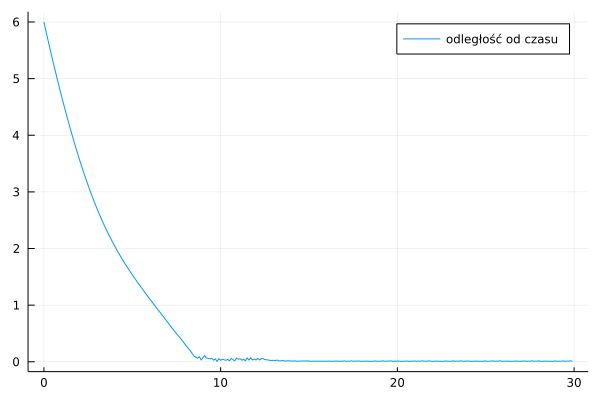

odl: 0.02943374273029847
x: 6.0
y: 8.9


In [17]:
meet(6,1.4, 0.04)

Rzeczywiście miejsce spotkania oscyluje wokół $y=8.9$. <br>
Niech teraz $k$ będzie małe, $k=1.1$.

In [18]:
pursued(t) = [5, t]
#animacje_proste(1.1,20)

pursued (generic function with 1 method)

<img src="animacje\proste1.1_20.gif"/>

Dla tak małego $k$ miejsce spotkania jest już dość oddalone, na tyle, że ciężko jest to wyczytać z animacji. Wiemy, że odbędzie się ono za $y=20$. Niech funkcja policzy to za nas.

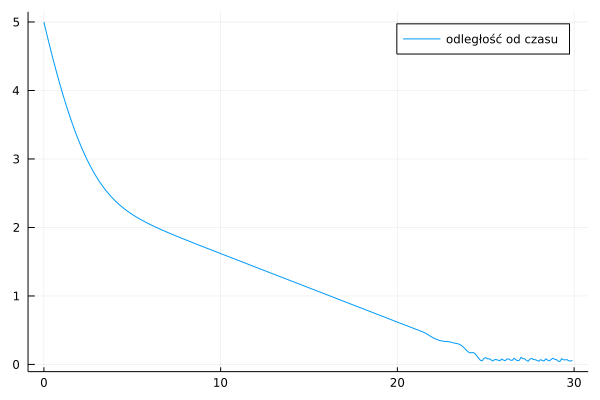

In [19]:
meet(5,1.1, 0.01)

Niestety dla tak małej wartosci dokładności program nie wykrył miejsca spotkania, ale z wykresu możemy stwierdzić, że miało to miejsce w okolicach $y=25$. Zwiększmy wartość dokładności. 

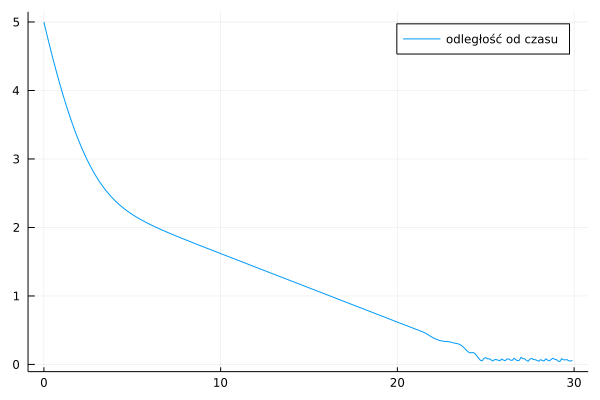

odl: 0.045766391204790396
x: 5.0
y: 27.4


In [20]:
meet(5,1.1, 0.05)

Po aktualizacji otrzymaliśmy informacje, że punkty spotkały się w okolicach punktu $(5,27)$. <br>
Jak widać, metoda znajdowania miejsca spotkania poprzez szukanie wartości odległości najbliższych zeru nie jest zbyt dokładna, jednak analizując wykresy i animacje możemy śmiało przewidywać wynik i będzie on zgodny dla obu tych metod. 

## Co by było gdyby cel uciekał po krzywej nie będącej prostą?<a class="anchor" id="nie-prosta"></a>
### Wyprowadzenie wzoru ogólnego <a class="anchor" id="param_wypr"></a>
<br>
Załóżmy, że nasz uciekinier w ramach urozmaicenia wybrał bardziej zawiłą ścieżkę ucieczki. Niech ucieka on po krzywej danej parametrycznie $r(t)=[r_{1}(t),r_{2}(t)]$. Chcemy sprawdzić jak tym razem wyglądałaby krzywa pościgu goniącego  $h(t)=[h_{1}(t),h_{2}(t)]$.<br>
I tym razem naszym celem jest wyznaczenie prostej stycznej do kierunku biegu uciekiniera, czyli wektora prędkości zawsze skierowanego w jego stronę, tylko teraz będzie on dany parametrycznie $\frac{dh(t)}{dt} = \left[ \frac{dh_{1}(t)}{dt},\frac{dh_{2}(t)}{dt}\right] $.<br>
Zaczniemy od wyznaczenia kierunku. Wektor prędkości, nazwijmy go $s(t)$, wyraża się poprzez wektor zmiany przemieszczenia na osi $X$ oraz $Y$, a więc $s(t) = \left[h_1(t)-r_1(t),h_2(t)-r_2t)\right]$. <br>
Chcemy jednak, by był on odpowiedniej długości, zatem pierwsze musimy go znormalizować - podzielić go przez długość $s(t)$, aby następnie pomnożyć przez długość szukanego wektora prędkości $\frac{dh(t)}{dt}$. <br>
Długość wektora $s(t)$ wyraża się wzorem $|s(t)| = \sqrt{\left(h_1(t)-r_1(t)\right)^2 + \left(h_2(t)-r_2(t)\right)^2}.$<br>
Długość $\left| \frac{dh(t)}{dt} \right|$ znajdziemy poprzez analogię do poprzedniego zagadnienia, czyli szukania prostych krzywych pościgowych. <br>
Wiemy jak wygląda tor ucieczki $r(t)$ i znamy zatem prędkość jak i długość wektora prędkości, gdyż $\left|\frac{dr(t)}{dt}\right| = \sqrt{\left( \frac{dr_1(t)}{dt}\right)^2 + \left( \frac{dr_2(t)}{dt}\right)^2}.$<br>
Jeśli teraz założymy, że stosunek prędkości goniącego do uciekiniera wyniesie pewną stałą $\frac{\left|\frac{dh(t)}{dt}\right|}{\left|\frac{dr(t)}{dt}\right|}=k$ to otrzymujemy, że $\left|\frac{dh(t)}{dt}\right|=k\left|\frac{dr(t)}{dt}\right|$.<br>
Wstawiamy wszystko do równania i otrzymujemy
$$\frac{dh(t)}{dt}=
k\frac{\left|\frac{dr(t)}{dt}\right|}{\left|r(t)-h(t)\right|}\left[ r_1(t)-h_1(t), r_2(t)-h_2(t)\right]=
k\frac{\sqrt{\left( \frac{dr_1(t)}{dt}\right)^2 + \left( \frac{dr_2(t)}{dt}\right)^2}}{\sqrt{\left(h_1(t)-r_1(t)\right)^2 + \left(h_2(t)-r_2(t)\right)^2}}\left[ r_1(t)-h_1(t), r_2(t)-h_2(t)\right].$$
Dzięki temu uzyskujemy ostateczne równania $\frac{dh_1(t)}{dt}$ oraz $\frac{dh_2(t)}{dt}$ krzywej pościgowej.
$$h_1'(t) = k\sqrt{\left( \frac{dr_1(t)}{dt}\right)^2 + \left( \frac{dr_2(t)}{dt}\right)^2}\frac{r_1(t)-h_1(t)}{\sqrt{\left(h_1(t)-r_1(t)\right)^2 + \left(h_2(t)-r_2(t)\right)^2}}$$ <br>
$$h_2'(t)= k\sqrt{\left( \frac{dr_1(t)}{dt}\right)^2 + \left( \frac{dr_2(t)}{dt}\right)^2}\frac{r_2(t)-h_2(t)}{\sqrt{\left(h_1(t)-r_1(t)\right)^2 + \left(h_2(t)-r_2(t)\right)^2}}$$


Jak widać są to równania dość skomplikowane, z których wyprowadzenie wzorów na $h_1(t)$ i $h_2(t)$ będzie bardzo trudne, szczególnie przy bardziej wyszukanych krzywych ucieczki $r(t)$. <br>

### Ucieczka po okręgu <a class="anchor" id="okrag"></a>

#### Wyprowadzenie <a class="anchor" id="okr_wypr"></a>
Załóżmy teraz, że nasz uciekinier porusza się po okręgu określonym parametrycznie $r(t)=[R\cos{t}, R\sin{t}]$, gdzie $R$ będzie danym, dodatnim promieniem. Do wyprowadzenia równania krzywej pościgu użyjemy oczywiście wyżej wyprowadzonego wzoru na $h(t)$. [[9]](#bib)
$$h_1'(t) = k\sqrt{\left( \frac{dr_1(t)}{dt}\right)^2 + \left( \frac{dr_2(t)}{dt}\right)^2}\frac{r_1(t)-h_1(t)}{\sqrt{\left(h_1(t)-r_1(t)\right)^2 + \left(h_2(t)-r_2(t)\right)^2}}$$
$$h_2'(t)= k\sqrt{\left( \frac{dr_1(t)}{dt}\right)^2 + \left( \frac{dr_2(t)}{dt}\right)^2}\frac{r_2(t)-h_2(t)}{\sqrt{\left(h_1(t)-r_1(t)\right)^2 + \left(h_2(t)-r_2(t)\right)^2}}$$

Obliczmy pierwsze $\sqrt{\left( \frac{dr_1(t)}{dt}\right)^2 + \left( \frac{dr_2(t)}{dt}\right)^2}$.<br>
$\frac{dr_1(t)}{dt}= \frac{d(R\cos{t})}{dt}=-R\sin{t}$ oraz $\frac{dr_1(t)}{dt}= \frac{d(R\sin{t})}{dt}=R\cos{t}$. <br>
Zauważmy zatem, że $\sqrt{\left( \frac{dr_1(t)}{dt}\right)^2 + \left( \frac{dr_2(t)}{dt}\right)^2} = 
\sqrt{\left( -R\sin{t}\right) ^2 + \left( R\cos{t}\right) ^2} = \sqrt{R^2[(\sin{t})^2 + (\cos{t})^2]} = |R| = R$. <br>

Dla przejrzystości zapisu zastosujmy podstawienie $h_1(t) = x$ oraz $h_2(t) = y$. <br>
Ostatecznie otrzymujemy, że 
$$x'(t) = kR\frac{R\cos{t} - x}{\sqrt{\left(R\cos{t}-x\right)^2 + \left(R\sin{t}-y\right)^2}},$$
$$y'(t) = kR\frac{R\sin{t} - y}{\sqrt{\left(R\cos{t}-x\right)^2 + \left(R\sin{t}-y\right)^2}},$$
gdzie $k$ jest stałą określającą stosunek prędkości punktów, a $R$ - promień okręgu po którym porusza się uciekinier.

Wykorzystajmy potęgę komputera i metod Julii do wygenerowania krzywej.<br>
Na początek weźmy $R=1$.

In [8]:
function lorenz!(du,u,k,t)
 du[1] = k*(cos(t)-u[1])/sqrt((cos(t)-u[1])^2+(sin(t)-u[2])^2)
 du[2] = k*(sin(t)-u[2])/sqrt((cos(t)-u[1])^2+(sin(t)-u[2])^2)
end

lorenz! (generic function with 1 method)

In [9]:
function okrag_param(k,tim=15)   
    u0 = [0.0;0.0]
    tspan = (0.0,tim)
    prob = ODEProblem(lorenz!,u0,tspan,k)
    sol = solve(prob)
    x = [cos(t) for t in 0:0.1:tim]
    y = [sin(t) for t in 0:0.1:tim]
    plot(x,y, color="mediumspringgreen", label="uciekinier", title=k)
    display(plot!(sol,vars=(1,2), color="purple", label="goniacy"))

end

okrag_param (generic function with 2 methods)

Porównajmy wykresy dla róznych stałych $k$.

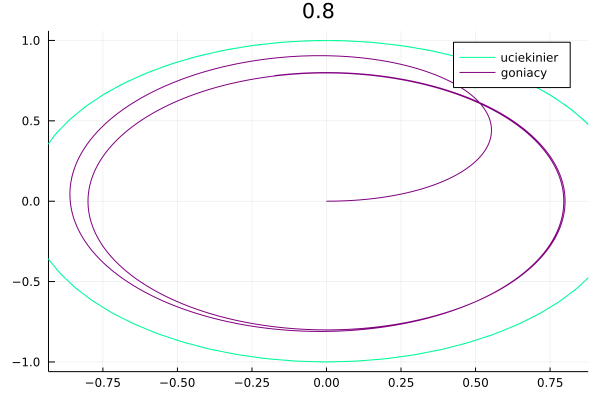

In [10]:
okrag_param(0.8)

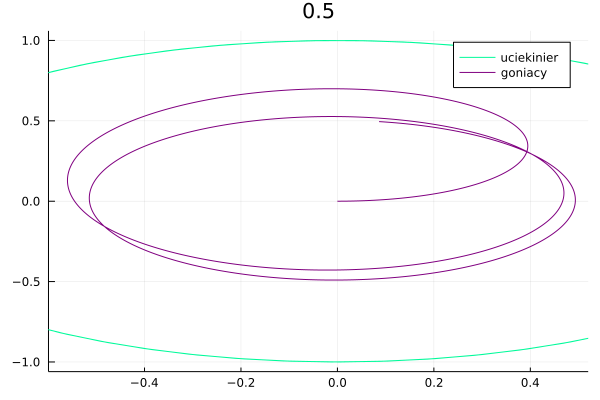

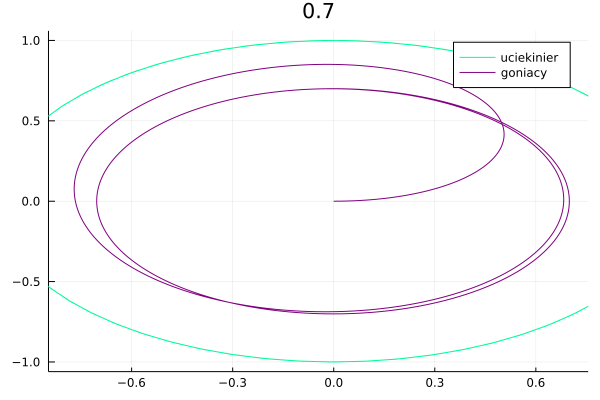

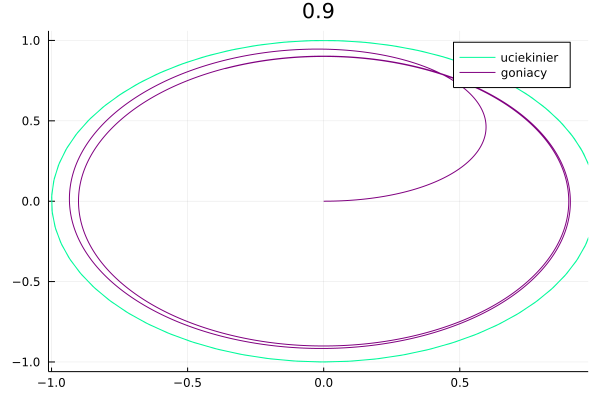

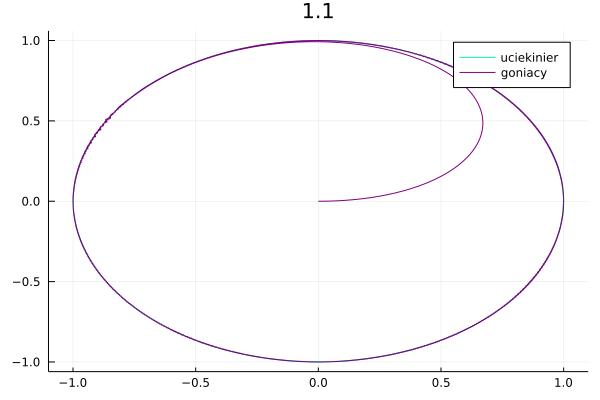

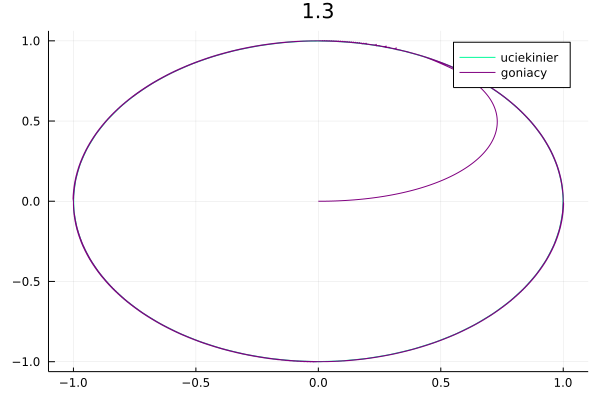

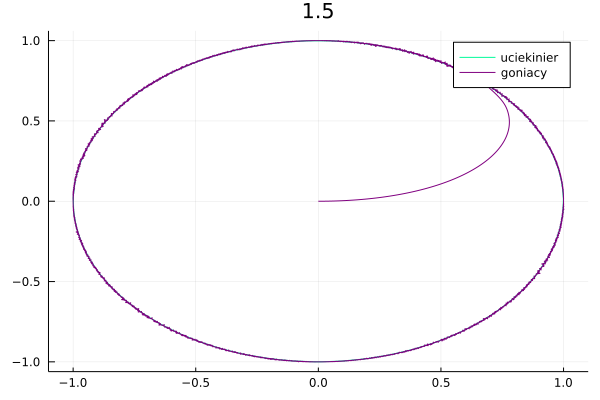

In [11]:
for k in 0.5:0.2:1.5
    okrag_param(k,15)
end

#### Jak się mają do siebie $R$ i $k$? <a class="anchor" id="RK"></a>

Wygląda na to, że i tym razem musi być spełniony warunek $k>1$, aby punkty się dogoniły.<br>
Sprawdźmy teraz, jak rzeczywiście zachowują się nasze punkty względem siebie dla różnych $R$ i $k$. <br>
Tworząc funkcję musimy wziąć jednak pod uwagę, że nasze $\alpha$, które wcześniej wzięliśmy za równe $1$, tym razem wynosi $R$.

In [14]:
pursuit(u, a, t) = a * (pursued(t) - u) / norm(pursued(t)-u) ##ogólne równanie 
#pursued(t) = [cos(t), sin(t)] ##sparametryzowana krzywa ucieczki 
prob = ODEProblem(pursuit, [0.0, 0.0], (0.0, 8), 0.8) ##miejsce początkowe, ilość wykonań, stała k
sol = solve(prob, saveat=0.1);

function anim_okrag(k,R=1,tim=10)
    pursued(t) = [R*cos(t), R*sin(t)]
    a = k*R
    anim = @animate for i = 1:0.1:tim
        prob = ODEProblem(pursuit, [0.0, 0.0], (0.0,i), a) 
        sol = solve(prob, saveat=0.1);

        pursuitplot(sol.t, pursued.(sol.t), label="uciekajacy", xlim=(-R-1,R+1), ylim=(-R-1,R+1), color="mediumspringgreen", title = k)
        pursuitplot!(sol.t, sol.u, label="goniacy", color="purple")
    end

    gif(anim, "okrag"*string(k)*".gif", fps = 10)
end


anim_okrag (generic function with 3 methods)

┌ Warning: Indices Base.OneTo(11) of attribute `linewidth` does not match data indices 1:10.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(11) of attribute `linewidth` does not match data indices 1:10.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(12) of attribute `linewidth` does not match data indices 1:11.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(12) of attribute `linewidth` does not match data indices 1:11.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(13) of attribute `linewidth` does not match data indices 1:12.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(13) of attribute `linewidth` does not match data indices 1:12.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(37) of attribute `linewidth` does not match data indices 1:36.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(37) of attribute `linewidth` does not match data indices 1:36.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(38) of attribute `linewidth` does not match data indices 1:37.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(38) of attribute `linewidth` does not match data indices 1:37.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(39) of attribute `linewidth` does not match data indices 1:38.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(39) of attribute `linewidth` does not match data indices 1:38.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(64) of attribute `linewidth` does not match data indices 1:63.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(64) of attribute `linewidth` does not match data indices 1:63.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(65) of attribute `linewidth` does not match data indices 1:64.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(65) of attribute `linewidth` does not match data indices 1:64.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(66) of attribute `linewidth` does not match data indices 1:65.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(66) of attribute `linewidth` does not match data indices 1:65.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(90) of attribute `linewidth` does not match data indices 1:89.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(90) of attribute `linewidth` does not match data indices 1:89.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(91) of attribute `linewidth` does not match data indices 1:90.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(91) of attribute `linewidth` does not match data indices 1:90.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(92) of attribute `linewidth` does not match data indices 1:91.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(92) of attribute `linewidth` does not match data indices 1:91.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

Plots.AnimatedGif("C:\\Users\\admin\\OneDrive\\Dokumenty\\GitHub\\Pursuit-curves-Lach-Mysliwiec\\okrag1.1.gif")
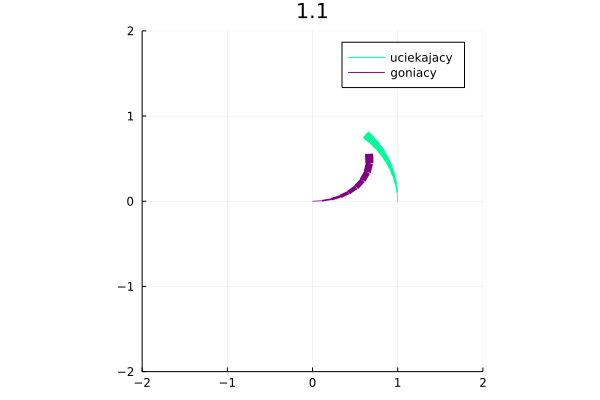

In [15]:
pursued(t) = [cos(t),sin(t)]
anim_okrag(1.1)
#anim_okrag(0.9)

<img src="animacje\okrag1.1.gif"/>
<img src="animacje\okrag0.9.gif"/>

Z animacji wynika, że rzeczywiście $k$ powinno być większe od $1$. Sprawdźmy jednak odległości punktów wykorzystując wcześniej stworzoną funkcję.

In [16]:
function meet_o(k, R=1, acc=0.01, lgth = 30) ##acc - accuracy czyli dokładnosc wyznaczenia miejsca spotkania
    pursued(t) = [R*cos(t),R*sin(t)]
    a = k*R
    prob = ODEProblem(pursuit, [0.0, 0.0], (0.0, lgth), a) 
    sol = solve(prob, saveat=0.1);

    odl = [sqrt((sol.u[i][1]-pursued.(sol.t)[i][1])^2 + (sol.u[i][2]-pursued.(sol.t)[i][2])^2) for i in 1:1:lgth*10]
    t = [i for i in 0:0.1:(lgth-0.1)]
    display(plot(t,odl,label="odległość od czasu",title=k))
    for i in 1:1:lgth*10
        if odl[i] < acc
            println("odl: ",odl[i])
            println("x: ",pursued.(sol.t)[i][1])
            println("y: ",pursued.(sol.t)[i][2])
            return
        end
    end
end

meet_o (generic function with 4 methods)

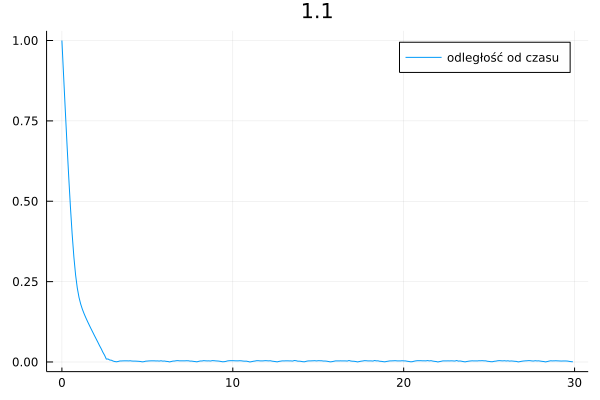

odl: 0.008876508727342797
x: -0.8568887533689473
y: 0.5155013718214642


In [17]:
pursued(t) = [cos(t),sin(t)]
meet_o(1.1)

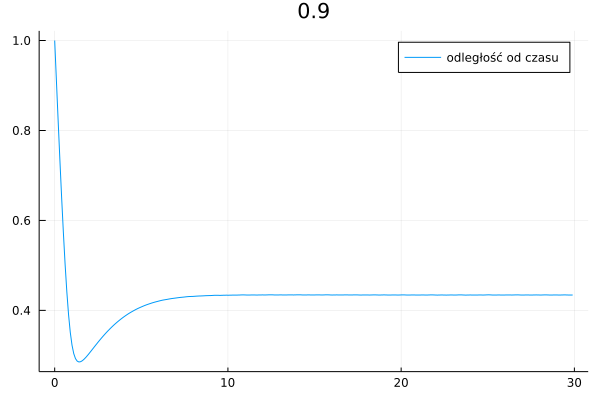

In [18]:
meet_o(0.9)

Można zauważyć, że dla $k=1.1$ wykres przybiera podobny kształt jak dla prostych krzywych pogoni w przypadku, gdy punkty się dogoniły. Funkcja policzyła nam, że stało się to mniej więcej w punkcie $(-0.9,0.5)$.<br>
Za to już w przypadku $k=0.9$ funkcja nie malała monotonicznie oraz odległości po pewnym czasie ustabilizowały się na jednym poziomie - w tym wypadku około $0.43$. Jest to dokładnie to, co zobaczyliśmy na animacji, gdyż i tam po pewnym czasie goniący zaczął krążyć po okręgu o pewnym stałym promieniu (wynoszącym około $0.9$).<br>
Teraz przeanalizujmy sytuację graniczną, czyli $k=1$.

In [84]:
#anim_okrag(1)

<img src="animacje\okrag1.gif"/>

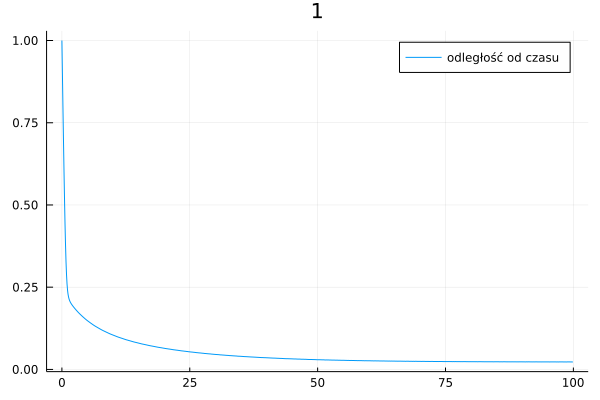

In [30]:
meet_o(1,1,0.01,100)

I tym razem dla $k=1$ teoretycznie goniący wchodzi na ścieżkę uciekiniera, lecz nie ma wystarczającej prędkości, by rzeczywiście go złapać.<br>
**Wniosek zatem jest taki, że dla $R=1$ $k>1$, aby punkty się spotkały.**

#### Co jeśli $R>1$?
Załóżmy teraz, że $R>1$. Ustaliliśmy już, że dla wszystkich poprzednich przypadków wystarczyło, żeby $k>1$, aby punkty się dogoniły. Sprawdźmy to dla różnych kombinacji stałych.

┌ Warning: Indices Base.OneTo(11) of attribute `linewidth` does not match data indices 1:10.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(11) of attribute `linewidth` does not match data indices 1:10.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(12) of attribute `linewidth` does not match data indices 1:11.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(12) of attribute `linewidth` does not match data indices 1:11.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(13) of attribute `linewidth` does not match data indices 1:12.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(13) of attribute `linewidth` does not match data indices 1:12.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(38) of attribute `linewidth` does not match data indices 1:37.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(38) of attribute `linewidth` does not match data indices 1:37.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(39) of attribute `linewidth` does not match data indices 1:38.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(39) of attribute `linewidth` does not match data indices 1:38.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(40) of attribute `linewidth` does not match data indices 1:39.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(40) of attribute `linewidth` does not match data indices 1:39.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(64) of attribute `linewidth` does not match data indices 1:63.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(64) of attribute `linewidth` does not match data indices 1:63.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(65) of attribute `linewidth` does not match data indices 1:64.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(65) of attribute `linewidth` does not match data indices 1:64.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(66) of attribute `linewidth` does not match data indices 1:65.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(66) of attribute `linewidth` does not match data indices 1:65.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(90) of attribute `linewidth` does not match data indices 1:89.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(90) of attribute `linewidth` does not match data indices 1:89.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(91) of attribute `linewidth` does not match data indices 1:90.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(91) of attribute `linewidth` does not match data indices 1:90.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(92) of attribute `linewidth` does not match data indices 1:91.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(92) of attribute `linewidth` does not match data indices 1:91.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(116) of attribute `linewidth` does not match data indices 1:115.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(116) of attribute `linewidth` does not match data indices 1:115.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(117) of attribute `linewidth` does not match data indices 1:116.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(117) of attribute `linewidth` does not match data indices 1:116.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(118) of attribute `linewidth` does not match data indices 1:117.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(118) of attribute `linewidth` does not match data indices 1:117.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning:

┌ Warning: Indices Base.OneTo(143) of attribute `linewidth` does not match data indices 1:142.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(143) of attribute `linewidth` does not match data indices 1:142.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(144) of attribute `linewidth` does not match data indices 1:143.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(144) of attribute `linewidth` does not match data indices 1:143.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(145) of attribute `linewidth` does not match data indices 1:144.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(145) of attribute `linewidth` does not match data indices 1:144.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning:

┌ Warning: Indices Base.OneTo(169) of attribute `linewidth` does not match data indices 1:168.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(170) of attribute `linewidth` does not match data indices 1:169.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(170) of attribute `linewidth` does not match data indices 1:169.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(171) of attribute `linewidth` does not match data indices 1:170.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(171) of attribute `linewidth` does not match data indices 1:170.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(172) of attribute `linewidth` does not match data indices 1:171.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning:

┌ Warning: Indices Base.OneTo(196) of attribute `linewidth` does not match data indices 1:195.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(196) of attribute `linewidth` does not match data indices 1:195.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(197) of attribute `linewidth` does not match data indices 1:196.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(197) of attribute `linewidth` does not match data indices 1:196.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(198) of attribute `linewidth` does not match data indices 1:197.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(198) of attribute `linewidth` does not match data indices 1:197.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning:

Plots.AnimatedGif("C:\\Users\\admin\\OneDrive\\Dokumenty\\GitHub\\Pursuit-curves-Lach-Mysliwiec\\okrag1.1.gif")
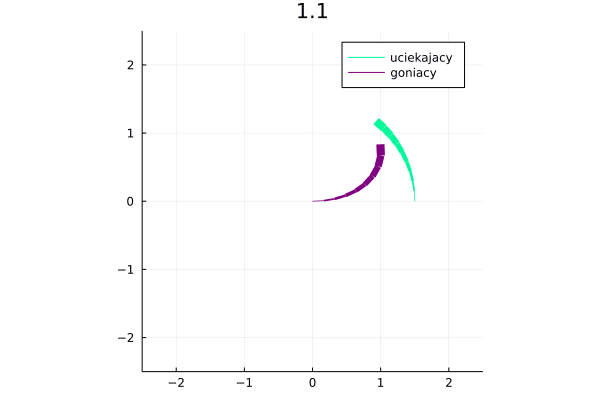

In [19]:
pursued(t) = [1.5*cos(t),1.5*sin(t)]
anim_okrag(1.1,1.5,20)

<img src="animacje\1.5okrag1.1.gif"/>

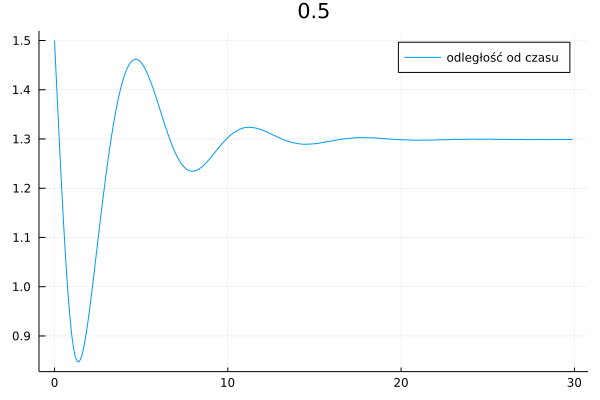

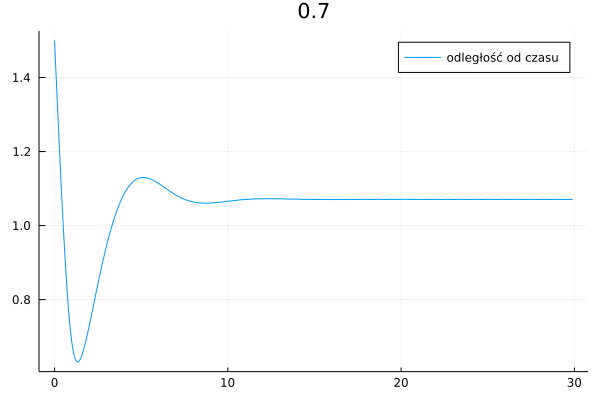

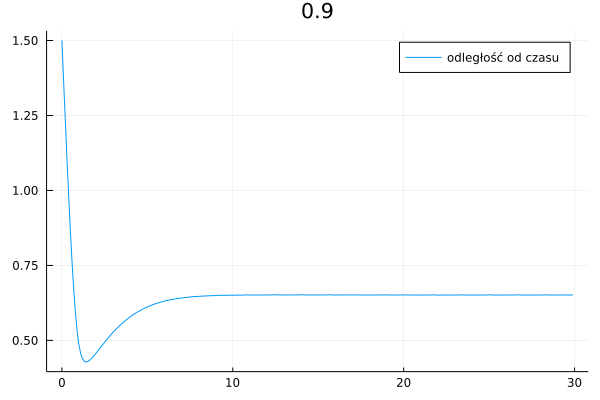

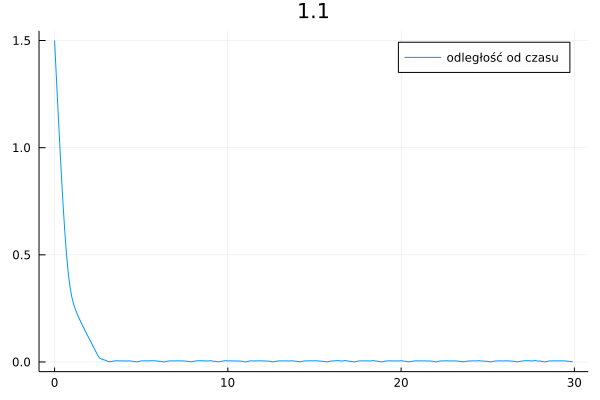

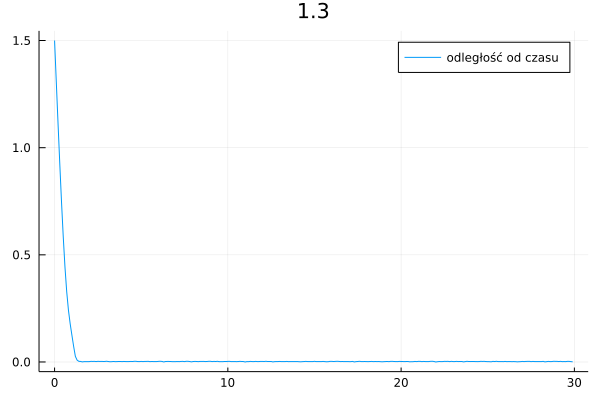

odl: 0.008929594004628847
x: -1.4564372477243859
y: 0.3588739938209736

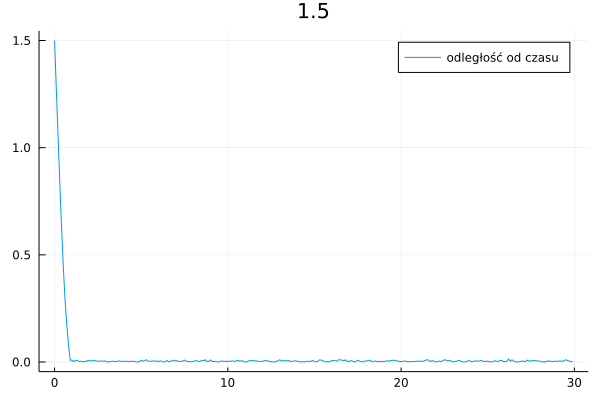


odl: 0.008735192398229528
x: 0.401248242936881
y: 1.4453372781257894
odl: 0.007530186083965444
x: 0.9324149524059966
y: 1.1749903644412252


In [24]:
for k in 0.5:0.2:1.5
    meet_o(k,1.5)
end

Z wykresów wynika, że i tym razem wystarczy, że $k>1$, aby punkty się spotkały, niezależnie od promienia $R$.

┌ Warning: Indices Base.OneTo(11) of attribute `linewidth` does not match data indices 1:10.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(11) of attribute `linewidth` does not match data indices 1:10.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(12) of attribute `linewidth` does not match data indices 1:11.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(12) of attribute `linewidth` does not match data indices 1:11.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(13) of attribute `linewidth` does not match data indices 1:12.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(13) of attribute `linewidth` does not match data indices 1:12.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(36) of attribute `linewidth` does not match data indices 1:35.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(37) of attribute `linewidth` does not match data indices 1:36.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(37) of attribute `linewidth` does not match data indices 1:36.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(38) of attribute `linewidth` does not match data indices 1:37.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(38) of attribute `linewidth` does not match data indices 1:37.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(39) of attribute `linewidth` does not match data indices 1:38.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(62) of attribute `linewidth` does not match data indices 1:61.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(63) of attribute `linewidth` does not match data indices 1:62.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(63) of attribute `linewidth` does not match data indices 1:62.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(64) of attribute `linewidth` does not match data indices 1:63.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(64) of attribute `linewidth` does not match data indices 1:63.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(65) of attribute `linewidth` does not match data indices 1:64.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(90) of attribute `linewidth` does not match data indices 1:89.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(90) of attribute `linewidth` does not match data indices 1:89.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(91) of attribute `linewidth` does not match data indices 1:90.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(91) of attribute `linewidth` does not match data indices 1:90.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(92) of attribute `linewidth` does not match data indices 1:91.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(92) of attribute `linewidth` does not match data indices 1:91.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(116) of attribute `linewidth` does not match data indices 1:115.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(116) of attribute `linewidth` does not match data indices 1:115.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(117) of attribute `linewidth` does not match data indices 1:116.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(117) of attribute `linewidth` does not match data indices 1:116.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(118) of attribute `linewidth` does not match data indices 1:117.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(118) of attribute `linewidth` does not match data indices 1:117.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning:

┌ Warning: Indices Base.OneTo(141) of attribute `linewidth` does not match data indices 1:140.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(142) of attribute `linewidth` does not match data indices 1:141.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(142) of attribute `linewidth` does not match data indices 1:141.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(143) of attribute `linewidth` does not match data indices 1:142.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(143) of attribute `linewidth` does not match data indices 1:142.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(144) of attribute `linewidth` does not match data indices 1:143.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning:

┌ Warning: Indices Base.OneTo(167) of attribute `linewidth` does not match data indices 1:166.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(167) of attribute `linewidth` does not match data indices 1:166.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(168) of attribute `linewidth` does not match data indices 1:167.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(168) of attribute `linewidth` does not match data indices 1:167.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(169) of attribute `linewidth` does not match data indices 1:168.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(169) of attribute `linewidth` does not match data indices 1:168.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning:

┌ Warning: Indices Base.OneTo(193) of attribute `linewidth` does not match data indices 1:192.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(193) of attribute `linewidth` does not match data indices 1:192.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(194) of attribute `linewidth` does not match data indices 1:193.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(194) of attribute `linewidth` does not match data indices 1:193.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(195) of attribute `linewidth` does not match data indices 1:194.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(195) of attribute `linewidth` does not match data indices 1:194.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning:

Plots.AnimatedGif("C:\\Users\\admin\\OneDrive\\Dokumenty\\GitHub\\Pursuit-curves-Lach-Mysliwiec\\okrag0.9.gif")
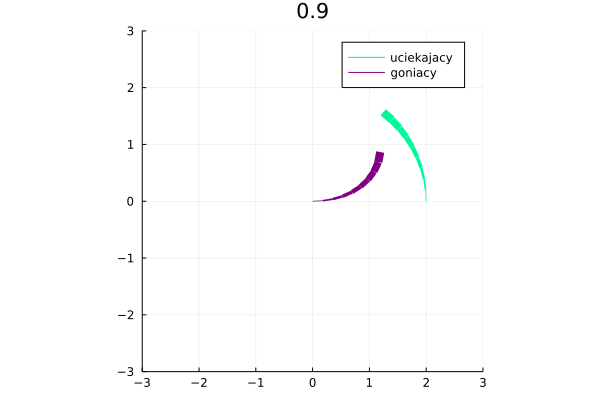

In [26]:
pursued(t) = [2*cos(t),2*sin(t)]
anim_okrag(0.9,2,20)

┌ Warning: Indices Base.OneTo(11) of attribute `linewidth` does not match data indices 1:10.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(11) of attribute `linewidth` does not match data indices 1:10.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(12) of attribute `linewidth` does not match data indices 1:11.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(12) of attribute `linewidth` does not match data indices 1:11.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(13) of attribute `linewidth` does not match data indices 1:12.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(13) of attribute `linewidth` does not match data indices 1:12.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(38) of attribute `linewidth` does not match data indices 1:37.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(39) of attribute `linewidth` does not match data indices 1:38.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(39) of attribute `linewidth` does not match data indices 1:38.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(40) of attribute `linewidth` does not match data indices 1:39.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(40) of attribute `linewidth` does not match data indices 1:39.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(41) of attribute `linewidth` does not match data indices 1:40.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(65) of attribute `linewidth` does not match data indices 1:64.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(66) of attribute `linewidth` does not match data indices 1:65.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(66) of attribute `linewidth` does not match data indices 1:65.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(67) of attribute `linewidth` does not match data indices 1:66.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(67) of attribute `linewidth` does not match data indices 1:66.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(68) of attribute `linewidth` does not match data indices 1:67.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(92) of attribute `linewidth` does not match data indices 1:91.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(93) of attribute `linewidth` does not match data indices 1:92.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(93) of attribute `linewidth` does not match data indices 1:92.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(94) of attribute `linewidth` does not match data indices 1:93.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(94) of attribute `linewidth` does not match data indices 1:93.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(95) of attribute `linewidth` does not match data indices 1:94.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(117) of attribute `linewidth` does not match data indices 1:116.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(118) of attribute `linewidth` does not match data indices 1:117.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(118) of attribute `linewidth` does not match data indices 1:117.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(119) of attribute `linewidth` does not match data indices 1:118.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(119) of attribute `linewidth` does not match data indices 1:118.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(120) of attribute `linewidth` does not match data indices 1:119.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning:

┌ Warning: Indices Base.OneTo(143) of attribute `linewidth` does not match data indices 1:142.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(143) of attribute `linewidth` does not match data indices 1:142.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(144) of attribute `linewidth` does not match data indices 1:143.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(144) of attribute `linewidth` does not match data indices 1:143.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(145) of attribute `linewidth` does not match data indices 1:144.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(145) of attribute `linewidth` does not match data indices 1:144.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning:

┌ Warning: Indices Base.OneTo(169) of attribute `linewidth` does not match data indices 1:168.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(170) of attribute `linewidth` does not match data indices 1:169.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(170) of attribute `linewidth` does not match data indices 1:169.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(171) of attribute `linewidth` does not match data indices 1:170.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(171) of attribute `linewidth` does not match data indices 1:170.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(172) of attribute `linewidth` does not match data indices 1:171.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning:

┌ Warning: Indices Base.OneTo(196) of attribute `linewidth` does not match data indices 1:195.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(196) of attribute `linewidth` does not match data indices 1:195.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(197) of attribute `linewidth` does not match data indices 1:196.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(197) of attribute `linewidth` does not match data indices 1:196.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(198) of attribute `linewidth` does not match data indices 1:197.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(198) of attribute `linewidth` does not match data indices 1:197.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning:

Plots.AnimatedGif("C:\\Users\\admin\\OneDrive\\Dokumenty\\GitHub\\Pursuit-curves-Lach-Mysliwiec\\okrag0.5.gif")
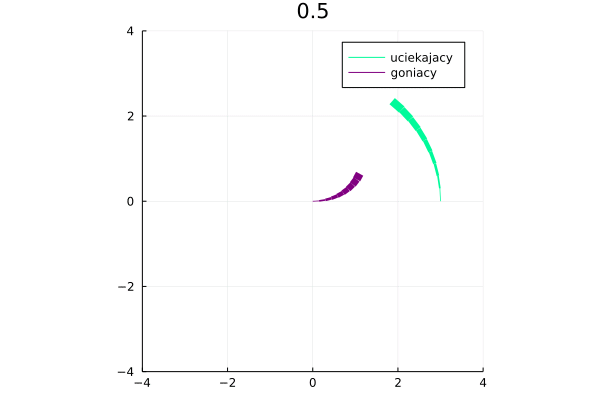

In [28]:
pursued(t) = [3*cos(t),3*sin(t)]
anim_okrag(0.5,3,20)

Możemy też zauważyć, że podobnie jak w przypadku $R=1$, gdy goniący nie ma wystarczającej prędkości ostetcznie ląduje on na okręgu o pewnym promieniu. Z animacji możemy wyczytać, że owy promień wynosi $r = Rk$.<br>



**Wniosek jest zatem taki, że aby punkty spotkały się ze sobą w ruchu po okręgu to $k>1$.<br>
W przypadku, gdy $k<1$ goniący ostatecznie zaczyna poruszać się po okręgu o promieniu równym $r = kR$.**

### Inne ciekawe przykłady ruchu po krzywych sparametryzowanych <a class="anchor" id="przyklady1"></a>

Oczywiście wystarczy dać ponieść się fantazji, aby wymyślić ciekawe krzywe ucieczki, a co za tym idzie nawet ciekawsze krzywe pogoni.<br>
Na początek weźmy znany nam ruch po okręgu, ale z punktem startowym goniącego gdzieś poza jego środkiem - na przykład w $(4,-1)$. Wtedy krzywa pogoni wygląda następująco.

In [35]:
pursued(t) = [cos(t),sin(t)]
#anim = @animate for i = 1:0.1:10
#    prob = ODEProblem(pursuit, [4.0, -1.0], (0.0,i), 1.1) 
#    sol = solve(prob, saveat=0.1);
#    pursuitplot(sol.t, pursued.(sol.t), label="uciekajacy", xlim=(-2,5), ylim=(-2,2), color="mediumspringgreen")
#    pursuitplot!(sol.t, sol.u, label="goniacy", color="purple")
#end
#gif(anim, "inne"*".gif", fps = 10)

<img src="animacje\inne.gif"/>

Kolejnym ciekawym przykładem jest *krzywa Talbota* dla $a = 0.9$.

In [36]:
pursued(t) = [(1 +  0.9*(sin(t))^2)*cos(t), (0.1 - 0.9*(cos(t))^2)*sin(t)]
#anim = @animate for i = 1:0.1:15
#    prob = ODEProblem(pursuit, [0,-4], (0.0,i), 0.9) 
#    sol = solve(prob, saveat=0.1);
#    pursuitplot(sol.t, pursued.(sol.t), label="uciekajacy", xlim=(-2,2), ylim=(-2,2), color="mediumspringgreen")
#    pursuitplot!(sol.t, sol.u, label="goniacy", color="purple")
#end
#gif(anim, "talbot"*".gif", fps = 10)

<img src="animacje\talbot.gif"/>

*Asteroida*.

In [37]:
pursued(t) = [3*cos(t)+cos(3*t),3*sin(t)-sin(3*t)]
#anim = @animate for i = 1:0.1:15
#    prob = ODEProblem(pursuit, [0,0], (0.0,i), 1.1) 
#    sol = solve(prob, saveat=0.1);
#    pursuitplot(sol.t, pursued.(sol.t), label="uciekajacy", xlim=(-5,5), ylim=(-5,5), color="mediumspringgreen")
#    pursuitplot!(sol.t, sol.u, label="goniacy", color="purple")
#end
#gif(anim, "asteroida"*".gif", fps = 10)

<img src="animacje\asteroida.gif"/>

Oraz *bikorn*. [[10]](#bib)

In [54]:
pursued(t) = [6*cos(t),6*(sin(t))^2/(2+sin(t))]
#anim = @animate for i = 1:0.1:18
#    prob = ODEProblem(pursuit, [0,0], (0.0,i), 1.5) 
#    sol = solve(prob, saveat=0.1);
#    pursuitplot(sol.t, pursued.(sol.t), label="uciekajacy", xlim=(-7,7), ylim=(-2,10), color="mediumspringgreen")
#    pursuitplot!(sol.t, sol.u, label="goniacy", color="purple")
#end
#gif(anim, "bikorn"*".gif", fps = 10)

<img src="animacje\bikorn.gif"/>

## Ucieczka w $\mathbb{R}^3$ <a class="anchor" id="3D"></a>

### Wzór ogólny <a class="anchor" id="wypr_3D"></a>

Wyprowadziliśmy wzory na krzywą ucieczki w układzie współrzędnych dwóch zmiennych, jednak jeszcze realistyczniejszy byłby ruch ciał w $\mathbb{R}^3$. Algorytm wyprowadzania równań jest identyczny. 

Mamy krzywą daną parametrycznie uciekającego $r(t)=[r_{1}(t),r_{2}(t),r_{3}(t)]$ i chcemy sprawdzić, jak tym razem wyglądałaby krzywa pościgu goniącego  $h(t)=[h_{1}(t),h_{2}(t), h_{3}(t)]$.<br>
Wektor prędkości goniącego jest postaci $\frac{dh(t)}{dt} = \left[ \frac{dh_{1}(t)}{dt},\frac{dh_{2}(t)}{dt}, \frac{dh_{3}(t)}{dt}\right] $.<br>
Wektor prędkości, wyznaczający kierunek, nazwijmy go $s(t)$, wyraża się poprzez wektor zmiany przemieszczenia na osi $X$ oraz $Y$, a więc $s(t) = \left[h_1(t)-r_1(t),h_2(t)-r_2(t),h_3(t)-r_3(t))\right]$. <br>
Chcemy jednak by był on odpowiedniej długości, zatem pierwsze musimy go znormalizować - podzielić go przez długość $s(t)$, aby następnie pomnożyć przez długość szukanego wektora prędkości $\frac{dh(t)}{dt}$. <br>
Długość wektora $s(t)$ wyraża się wzorem $|s(t)| = \sqrt{\left(h_1(t)-r_1(t)\right)^2 + \left(h_2(t)-r_2(t)\right)^2 + \left(h_3(t)-r_3(t)\right)^2}.$<br>
A długość $\left| \frac{dh(t)}{dt} \right|$ znajdziemy przez wykorzystanie założenia, że stosunek prędkości goniącego do uciekiniera wyniesie pewną stałą $\frac{\left|\frac{dh(t)}{dt}\right|}{\left|\frac{dr(t)}{dt}\right|}=k$. <br>
Otrzymujemy, że $\left|\frac{dh(t)}{dt}\right|=k\left|\frac{dr(t)}{dt}\right|$.Wstawiamy wszystko do równania.
$$\frac{dh(t)}{dt}=
k\frac{\left|\frac{dr(t)}{dt}\right|}{\left|r(t)-h(t)\right|}\left[ r_1(t)-h_1(t), r_2(t)-h_2(t), r_3(t)-h_3(t)\right]$$

Dzięki temu uzyskujemy ostateczne równania $\frac{dh_1(t)}{dt}$, $\frac{dh_2(t)}{dt}$ oraz $\frac{dh_3(t)}{dt}$ szukanej krzywej pościgowej.<br> <br>
$$h_1'(t) = k\sqrt{\left( \frac{dr_1(t)}{dt}\right)^2 + \left( \frac{dr_2(t)}{dt}\right)^2 + \left( \frac{dr_3(t)}{dt}\right)^2}\frac{r_1(t)-h_1(t)}{\sqrt{\left(h_1(t)-r_1(t)\right)^2 + \left(h_2(t)-r_2(t)\right)^2 + \left(h_3(t)-r_3(t)\right)^2 }}$$
$$h_2'(t)= k\sqrt{\left( \frac{dr_1(t)}{dt}\right)^2 + \left( \frac{dr_2(t)}{dt}\right)^2 + \left( \frac{dr_3(t)}{dt}\right)^2}\frac{r_2(t)-h_2(t)}{\sqrt{\left(h_1(t)-r_1(t)\right)^2 + \left(h_2(t)-r_2(t)\right)^2 + \left(h_3(t)-r_3(t)\right)^2 }}$$
$$h_3'(t)= k\sqrt{\left( \frac{dr_1(t)}{dt}\right)^2 + \left( \frac{dr_2(t)}{dt}\right)^2 + \left( \frac{dr_3(t)}{dt}\right)^2}\frac{r_3(t)-h_3(t)}{\sqrt{\left(h_1(t)-r_1(t)\right)^2 + \left(h_2(t)-r_2(t)\right)^2 + \left(h_3(t)-r_3(t)\right)^2 }}$$

### Ruch po helisie <a class="anchor" id="helisa"></a>

Załóżmy, że uciekinier ucieka po krzywej danej parametrycznie w $\mathbb{R}^3$  wzorem $r(t)=[cos(t),sin(t),t]$. Zatem
$$\begin{align}
\frac{dr_1(t)}{dt} &= -sin(t), \\
\frac{dr_2(t)}{dt} &= cos(t), \\
\frac{dr_3(t)}{dt} &= 1.
\end{align} $$
Stąd
$$\sqrt{\left( \frac{dr_1(t)}{dt}\right)^2 + \left( \frac{dr_2(t)}{dt}\right)^2 + \left( \frac{dr_3(t)}{dt}\right)^2} =\sqrt{\left(-sin(t)\right)^2 + \left( cos(t)\right)^2 + 1^2}  = \sqrt{1+1} = \sqrt{2}.$$

Dla przejrzystości zapiszmy $h(t)=[x(t),y(t),z(t)]$. Krzywa ma zatem postać <br> $$\frac{dh(t)}{dt}=
\frac{k\sqrt{2}}{\sqrt{\left(x(t)-cos(t)\right)^2 + \left(y(t)-sin(t)\right)^2 + \left(z(t)-t\right)^2 }}\left[ cos(t)-x(t), sin(t)-y(t), t-z(t)\right].$$ <br>

In [29]:
function lorenz2!(du,u,k,t)
 du[1] = sqrt(2)*k*(cos(t)-u[1])/sqrt((cos(t)-u[1])^2+(sin(t)-u[2])^2 + (t-u[3])^2)
 du[2] = sqrt(2)*k*(sin(t)-u[2])/sqrt((cos(t)-u[1])^2+(sin(t)-u[2])^2 + (t-u[3])^2)
 du[3] = sqrt(2)*k*(t-u[3])/sqrt((cos(t)-u[1])^2+(sin(t)-u[2])^2 + (t-u[3])^2)
end
function sruba(k,tim=15)
    u0 = [0.0;0.0;0.0]
    tspan = (0.0,tim)
    prob = ODEProblem(lorenz2!,u0,tspan,k)
    sol = solve(prob)
    x = [cos(t) for t in 0:0.1:tim]
    y = [sin(t) for t in 0:0.1:tim]
    z = [t for t in 0:0.1:tim]
    plot(x,y,z, color="crimson",label="uciekinier", title=k)
    display(plot!(sol,vars=(1,2,3), color="chartreuse1",label="goniacy"))
end

sruba (generic function with 2 methods)

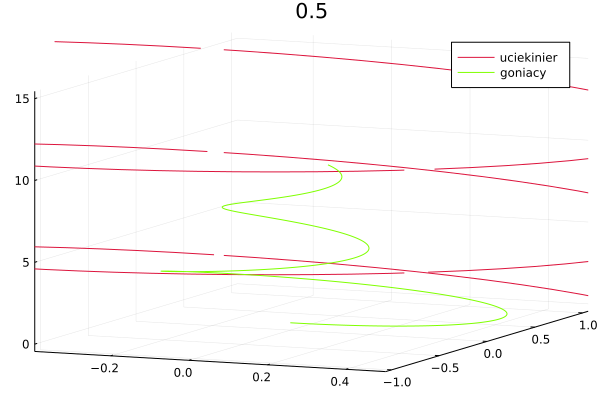

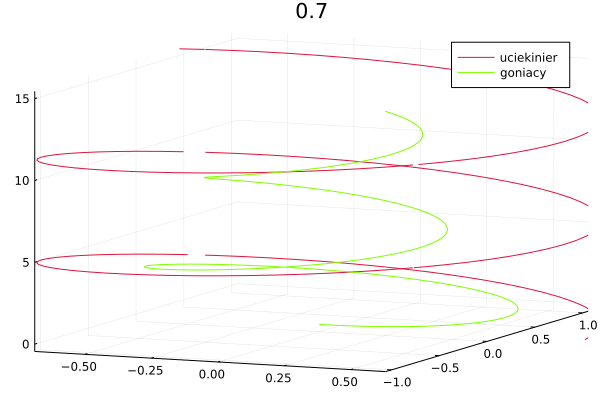

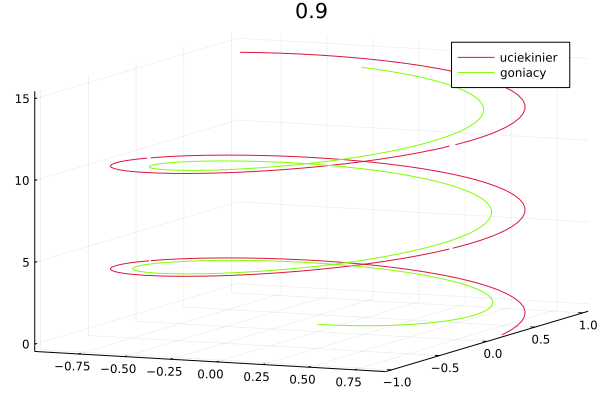

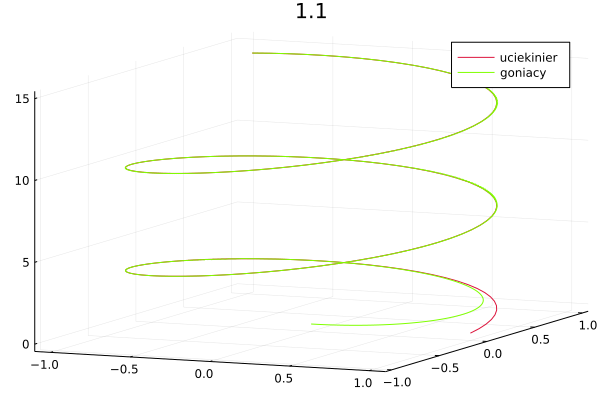

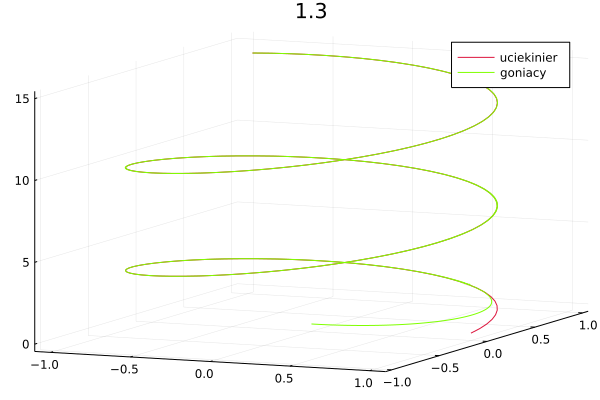

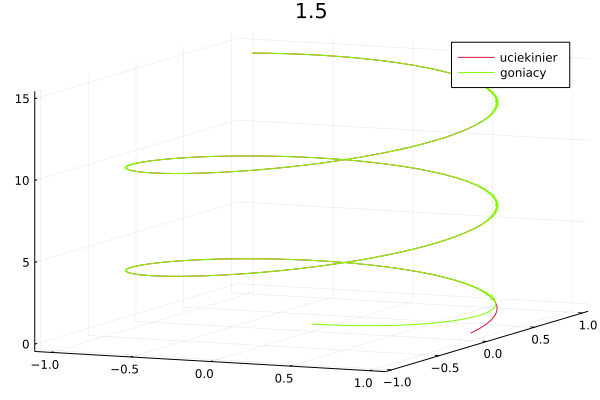

In [30]:
for k in 0.5:0.2:1.5
    sruba(k)
end

Jeszcze raz zobrazujmy sytuację animacjami, tym razem w układzie trzech współrzędnych, aby dowiedzieć się dla jakich $k$ punkty tym razem się dogonią.

In [31]:
@userplot PursuitPlot3
@recipe function f(cp::PursuitPlot3)
    t, u = cp.args
    x = [u[i][1] for i in 1:1:length(u)-1]
    y = [u[i][2] for i in 1:1:length(u)-1]
    z = [u[i][3] for i in 1:1:length(u)-1]
    n = length(x) ##im dłuzsza lista x tym grubszy marker
    linewidth --> range(0.75, 10, length = n+1)
    aspect_ratio --> 1
    x, y, z
end

pursuit(u, k, t) = k * (pursued(t) - u) / norm(pursued(t)-u) ##ogólne równanie 
pursued(t) = [cos(t), sin(t),t] ##sparametryzowana krzywa ucieczki 

function anim_r3(k)
    anim = @animate for i = 1:0.1:10
        prob = ODEProblem(pursuit, [0, 0, 0], (0.0,i), k*sqrt(2)) 
        sol = solve(prob, saveat=0.1);
        pursuitplot3(sol.t, pursued.(sol.t), label="uciekajacy", xlim=(-5,5), ylim=(-5,5),zlim=(0,10), color="crimson", title=k)
        pursuitplot3!(sol.t, sol.u, label="goniacy", color="chartreuse1")
    end
    gif(anim, "r3a"*string(k)*".gif", fps = 10)
end

anim_r3 (generic function with 1 method)

┌ Warning: Indices Base.OneTo(11) of attribute `linewidth` does not match data indices 1:10.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(11) of attribute `linewidth` does not match data indices 1:10.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(12) of attribute `linewidth` does not match data indices 1:11.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(12) of attribute `linewidth` does not match data indices 1:11.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(13) of attribute `linewidth` does not match data indices 1:12.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(13) of attribute `linewidth` does not match data indices 1:12.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(37) of attribute `linewidth` does not match data indices 1:36.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(37) of attribute `linewidth` does not match data indices 1:36.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(38) of attribute `linewidth` does not match data indices 1:37.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(38) of attribute `linewidth` does not match data indices 1:37.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(39) of attribute `linewidth` does not match data indices 1:38.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(39) of attribute `linewidth` does not match data indices 1:38.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(63) of attribute `linewidth` does not match data indices 1:62.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(63) of attribute `linewidth` does not match data indices 1:62.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(64) of attribute `linewidth` does not match data indices 1:63.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(64) of attribute `linewidth` does not match data indices 1:63.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(65) of attribute `linewidth` does not match data indices 1:64.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(65) of attribute `linewidth` does not match data indices 1:64.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(88) of attribute `linewidth` does not match data indices 1:87.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(89) of attribute `linewidth` does not match data indices 1:88.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(89) of attribute `linewidth` does not match data indices 1:88.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(90) of attribute `linewidth` does not match data indices 1:89.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(90) of attribute `linewidth` does not match data indices 1:89.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(91) of attribute `linewidth` does not match data indices 1:90.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(22) of attribute `linewidth` does not match data indices 1:21.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(23) of attribute `linewidth` does not match data indices 1:22.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(23) of attribute `linewidth` does not match data indices 1:22.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(24) of attribute `linewidth` does not match data indices 1:23.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(24) of attribute `linewidth` does not match data indices 1:23.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(25) of attribute `linewidth` does not match data indices 1:24.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(49) of attribute `linewidth` does not match data indices 1:48.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(49) of attribute `linewidth` does not match data indices 1:48.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(50) of attribute `linewidth` does not match data indices 1:49.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(50) of attribute `linewidth` does not match data indices 1:49.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(51) of attribute `linewidth` does not match data indices 1:50.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(51) of attribute `linewidth` does not match data indices 1:50.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(74) of attribute `linewidth` does not match data indices 1:73.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(75) of attribute `linewidth` does not match data indices 1:74.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(75) of attribute `linewidth` does not match data indices 1:74.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(76) of attribute `linewidth` does not match data indices 1:75.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(76) of attribute `linewidth` does not match data indices 1:75.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(77) of attribute `linewidth` does not match data indices 1:76.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(100) of attribute `linewidth` does not match data indices 1:99.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(100) of attribute `linewidth` does not match data indices 1:99.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(101) of attribute `linewidth` does not match data indices 1:100.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(101) of attribute `linewidth` does not match data indices 1:100.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Info: Saved animation to 
│   fn = C:\Users\admin\OneDrive\Dokumenty\GitHub\Pursuit-curves-Lach-Mysliwiec\r3a1.4.gif
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\admin\\OneDrive\\Dokumenty\\GitHub\\Pursuit-curves-Lach-Mysliwiec\\r3a1.4.gif")
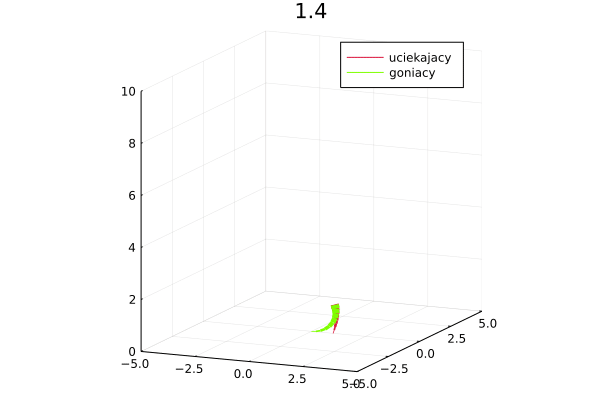

In [32]:
anim_r3(0.9)
anim_r3(1.4)
anim_r3(0.5)

┌ Warning: Indices Base.OneTo(11) of attribute `linewidth` does not match data indices 1:10.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(11) of attribute `linewidth` does not match data indices 1:10.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(12) of attribute `linewidth` does not match data indices 1:11.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(12) of attribute `linewidth` does not match data indices 1:11.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(13) of attribute `linewidth` does not match data indices 1:12.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(13) of attribute `linewidth` does not match data indices 1:12.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(38) of attribute `linewidth` does not match data indices 1:37.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(38) of attribute `linewidth` does not match data indices 1:37.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(39) of attribute `linewidth` does not match data indices 1:38.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(39) of attribute `linewidth` does not match data indices 1:38.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(40) of attribute `linewidth` does not match data indices 1:39.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(40) of attribute `linewidth` does not match data indices 1:39.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(64) of attribute `linewidth` does not match data indices 1:63.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(65) of attribute `linewidth` does not match data indices 1:64.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(65) of attribute `linewidth` does not match data indices 1:64.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(66) of attribute `linewidth` does not match data indices 1:65.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(66) of attribute `linewidth` does not match data indices 1:65.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(67) of attribute `linewidth` does not match data indices 1:66.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

┌ Warning: Indices Base.OneTo(91) of attribute `linewidth` does not match data indices 1:90.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(92) of attribute `linewidth` does not match data indices 1:91.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(92) of attribute `linewidth` does not match data indices 1:91.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(93) of attribute `linewidth` does not match data indices 1:92.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(93) of attribute `linewidth` does not match data indices 1:92.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Base.OneTo(94) of attribute `linewidth` does not match data indices 1:93.
└ @ Plots C:\Users\admin\.julia\packages\Plots\FKcum\src\utils.jl:108
┌ Warning: Indices Bas

Plots.AnimatedGif("C:\\Users\\admin\\OneDrive\\Dokumenty\\GitHub\\Pursuit-curves-Lach-Mysliwiec\\r3a0.5.gif")
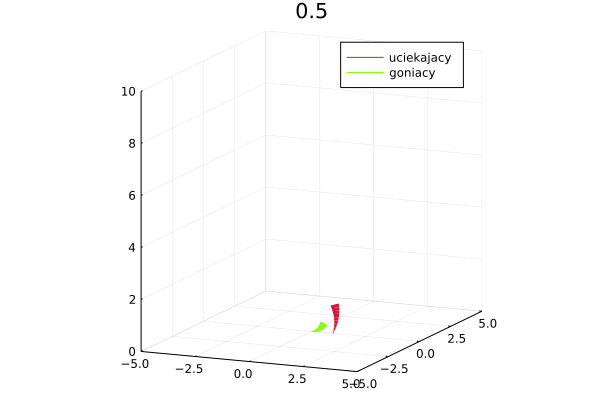

In [33]:
anim_r3(0.5)

Tym razem sytuacja zdaje się zmieniać pomiędzy $k=1.5$ i $k=5$. Jednak poprzez analogię z poprzedniego przykładu można przypuszczać, że wartością graniczną będzie tym razem $\sqrt{2}$.

In [34]:
function meet_r3(k, acc=0.01, lgth = 30) ##acc - accuracy czyli dokładnosc wyznaczenia miejsca spotkania
    pursued(t) = [cos(t),sin(t), t]
    prob = ODEProblem(pursuit, [0, 0, 0], (0.0,lgth), k*sqrt(2)) 
    sol = solve(prob, saveat=0.1);
        
    odl = [sqrt((sol.u[i][1]-pursued.(sol.t)[i][1])^2 + (sol.u[i][2]-pursued.(sol.t)[i][2])^2 + (sol.u[i][3]-pursued.(sol.t)[i][3])^2) for i in 1:1:lgth*10]
    t = [i for i in 0:0.1:(lgth-0.1)]
    display(plot(t,odl,label="odległość od czasu",title=k))
    for i in 1:1:lgth*10
        if odl[i] < acc
            println("odl: ",odl[i])
            println("x: ",pursued.(sol.t)[i][1])
            println("y: ",pursued.(sol.t)[i][2])
            println("z: ",pursued.(sol.t)[i][3])
            return
        end
    end
end

meet_r3 (generic function with 3 methods)

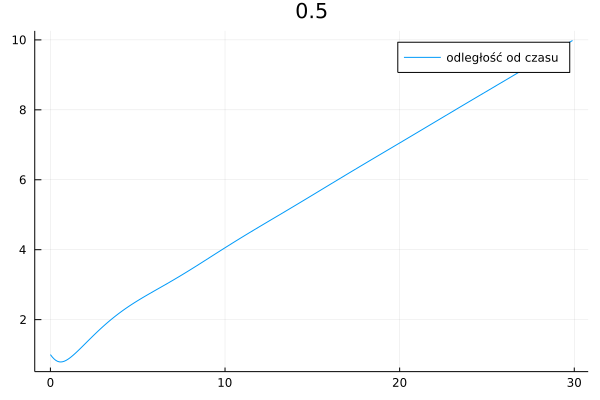

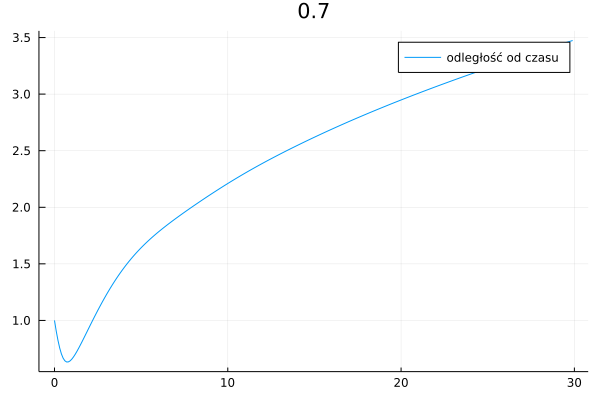

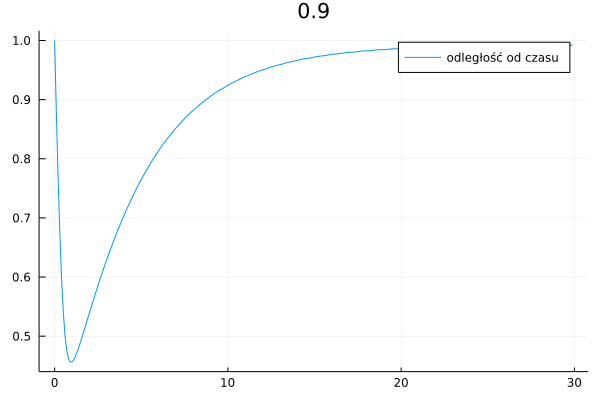

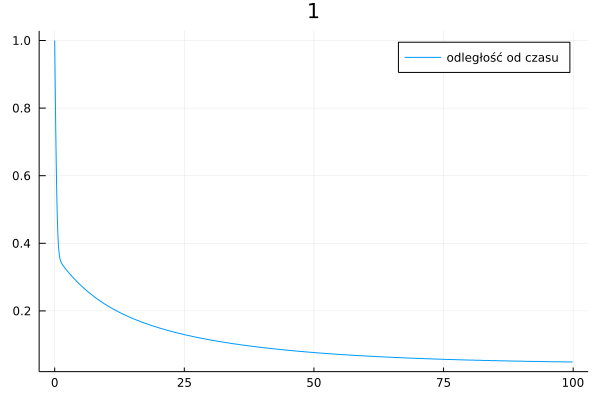

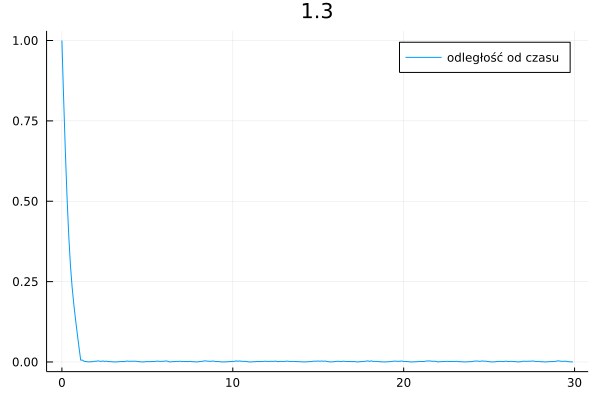

odl: 0.0059253866487387445
x: 0.4535961214255773
y: 0.8912073600614354
z: 1.1


In [41]:
meet_r3(0.5)
meet_r3(0.7)
meet_r3(0.9)
meet_r3(1, 0.01,100)
meet_r3(1.3)

Tym razem wykresy nie są tak jednoznaczne, jak w poprzednich przypadkach. Nie zachowują się one ani monotonicznie ani nie ustalają się na ustalonych wartościach. Niemniej jednak jesteśmy w stanie z nich wyczytać, że dla $k>1$ punkty ostatecznie się spotykają.

### Inne krzywe pogoni w $\mathbb{R}^3$ <a class="anchor" id="przyklady2"></a>
Tym razem Julia znów nie zawodzi i świetnie radzi sobie z generowaniem animacji dla fantazyjnych krzywych ucieczki.

In [44]:
pursuit(u, k, t) = k * (pursued(t) - u) / norm(pursued(t)-u) ##ogólne równanie 
pursued(t) = [(cos(t))^2 - sin(2*t), sin(t),cos(t)] ##sparametryzowana krzywa ucieczki 
#anim = @animate for i = 1:0.1:15
#    prob = ODEProblem(pursuit, [4, 3, 0], (0.0,i), 1.1) 
#    sol = solve(prob, saveat=0.1);
#    pursuitplot3(sol.t, pursued.(sol.t), label="uciekajacy", xlim=(-3,3), ylim=(-3,3),zlim=(-2,2), color="crimson")
#    pursuitplot3!(sol.t, sol.u, label="goniacy", color="chartreuse1")
#end
#gif(anim, "cos"*".gif", fps = 10)


<img src="animacje\cos.gif"/>

In [45]:
pursuit(u, k, t) = k * (pursued(t) - u) / norm(pursued(t)-u) ##ogólne równanie 
pursued(t) = [(cos(t))^2 - sin(2*t), sin(t)+t/5,cos(t)] ##sparametryzowana krzywa ucieczki 
#anim = @animate for i = 1:0.1:15
#    prob = ODEProblem(pursuit, [4, 3, 0], (0.0,i), 1.1) 
#    sol = solve(prob, saveat=0.1);
#    pursuitplot3(sol.t, pursued.(sol.t), label="uciekajacy", xlim=(-3,3), ylim=(-3,3),zlim=(-2,2), color="crimson")
#    pursuitplot3!(sol.t, sol.u, label="goniacy", color="chartreuse1")
#end
#gif(anim, "cos2"*".gif", fps = 10)

<img src="animacje\cos2.gif"/>

In [46]:
pursued(t) = [sin(t)*cos(t), t/5, sin(t)-cos(t)]
#anim = @animate for i = 1:0.1:15
#    prob = ODEProblem(pursuit, [-2, 1, -1], (0.0,i), 1.1) 
#    sol = solve(prob, saveat=0.1);
#    pursuitplot3(sol.t, pursued.(sol.t), label="uciekajacy", xlim=(-2,2), ylim=(-2,2),zlim=(-2,2), color="crimson")
#    pursuitplot3!(sol.t, sol.u, label="goniacy", color="chartreuse1")
#end
#gif(anim, "cos3"*".gif", fps = 10)

<img src="animacje\cos3.gif"/>

In [47]:
pursuit(u, k, t) = k * (pursued(t) - u) / norm(pursued(t)-u) ##ogólne równanie 
pursued(t) = [(cos(t))^3 - (sin(t))^2 - sin(2*t), sin(t)+t/5,cos(t) - sin(2*t)] ##sparametryzowana krzywa ucieczki 


#anim = @animate for i = 1:0.1:15
#    prob = ODEProblem(pursuit, [4, 3, 0], (0.0,i), 1.1) 
#    sol = solve(prob, saveat=0.1);
#    pursuitplot3(sol.t, pursued.(sol.t), label="uciekajacy", xlim=(-3,3), ylim=(-3,3),zlim=(-2,2), color="crimson")
#    pursuitplot3!(sol.t, sol.u, label="goniacy", color="chartreuse1")
#end
#gif(anim, "cos4"*".gif", fps = 10)

<img src="animacje\cos4.gif"/>

_________________

## "Mice Problem" <a class="anchor" id="mice"></a>

### Zadanie o 4 pająkach <a class="anchor" id="pajak"></a>

Temat zaczniemy zadaniem, które wzoruje się na innym, znalezionym autorstwa *Jamesa Stewarta* [[11]](#bib). Mianowicie opiszemy ruch 4 pająków (znajdziemy krzywą, po której się poruszają), które 'siedzą' w czterech różnych wierzchołkach kwadratowego sufitu. Każdy z nich zacznie podążać w kierunku sąsiada, aż do spotkania na samym środku.<br>
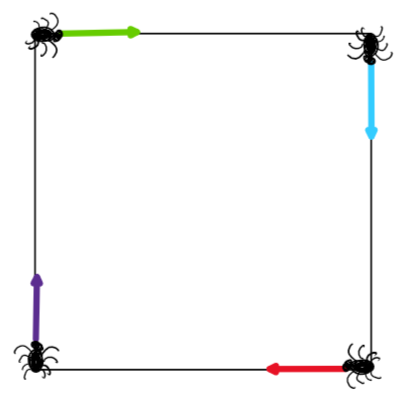
Na poniższy rysunku widać jak zmienia się kierunek ich wektorów prędkości w zależności od aktualnego położenia ich 'celu'<br>
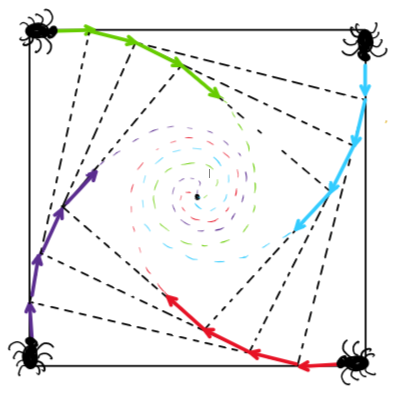

Rozważmy ten problem na układzie współrzędnych, interpretując sufit jako kwadrat o wymiarach $2$x$2$ ze środkiem pokrywającym się z początkiem tego układu. Ustawienie pająka $A$ ustalimy jako punkt $(1, 1)$, pająka $B(1, -1)$ itd... <br>
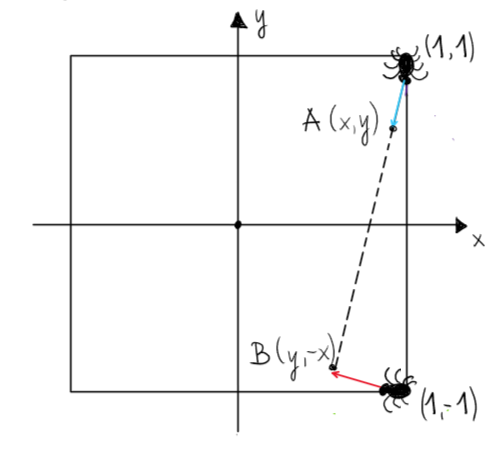

Współczynnik kierunkowy prostej $|AB|$ możemy wyznaczyć i zapisać jako $\frac{y+x}{x-y}$. Jest to styczna do krzywej ruchu pająków, której nachylenie się nie zmienia, dlatego też możemy zapisać $$\frac{dy}{dx} = \frac{y+x}{x-y},$$
$$dy = \frac{(y+x)dx}{x-y}.$$

Aby rozwiązać równanie $y=y(x)$ skorzystamy z podstawienia <br> $$z=\frac{y}{x} \Rightarrow \begin{vmatrix}y = zx \\ dy = zdx + xdz \end{vmatrix}.$$ <br>
W łatwy sposób możemy je rozwiązać, używając metody rozdzielenia zmiennych.
$$ zdx + xdz = \frac{(z + 1)dx}{1 - z} $$ <br>
$$ xdz = (\frac{z + 1}{1 - z} - z)dx $$ <br>
$$ \frac{1 - z}{z^2 + 1}dz = \frac{1}{x}dx $$

Scałkujemy obie strony równania.

$$ \int \frac{1 - z}{z^2 + 1} dz = \int \frac{1}{x}dx $$ <br>
Rozwiążemy osobno lewą całkę (prawa jest elementarna).
$$ L = \int \frac{1 - z}{z^2 + 1} dz = -\frac{1}{2} \int \frac{2z}{z^2 + 1}dz + \int \frac{1}{z^2 + 1}dz = \begin{vmatrix} u = z^2 + 1 \\ du = 2zdz \end{vmatrix} \\ = -\frac{1}{2} \int \frac{1}{u}du + \arctan{z} = \arctan{z} - \frac{\ln{(z^2 + 1)}}{2}$$

Dochodzimy do rozwiązania postaci
$$ \arctan{z} - \frac{\ln{(z^2 + 1)}}{2} = \ln{x} + C , $$
a wracając do podstawienia $z = \frac{y}{x}$ otrzymujemy
$$ \arctan{\frac{y}{x}} - \ln{\sqrt{y^2 + x^2}} = C . $$ <br>
Teraz, podstawiając współrzędne początkowe pająka $A$ tj. $x = 1$ oraz $y = 1$, możemy wyznaczyć stałą $C$.<br>
$$ C = \arctan{1} - \ln{\sqrt{2}}$$
$$ C = \frac{\pi}{4} - \ln{\sqrt{2}} $$
Ostatecznie
$$ \arctan{\frac{y}{x}} =  \ln{\sqrt{y^2 + x^2}} + \frac{\pi}{4} - \ln{\sqrt{2}} .$$

Nie otrzymujemy jednak jawnego rozwiązania, dlatego skorzystamy ze współrzędnych biegunowych. <br>
<br>
$$\begin{cases}
x = r\cos{\phi} \\ y = r\sin{\phi}
\end{cases} \Rightarrow \begin{cases} \phi = \arctan{\frac{y}{x}} \\ r^2 = x^2 + y^2
\end{cases}$$
Podstawiając je, spróbujemy wyznaczyć $r$.
$$\begin{align}
\phi &= \ln{r} + \frac{\pi}{4} - \ln{\sqrt{2}} \\
\ln{r} &= \ln{\sqrt{2}} + \phi - \frac{\pi}{4} \\
r &= \sqrt{2}e^{(\phi - \frac{\pi}{4})} 
\end{align}$$
Jest to równanie `spirali logarytmicznej` $ r = ae^{(b\phi)} $ ze stałymi $a = \sqrt2, b = 1$. Przesunięcie fazowe o $\frac{\pi}{4}$ wynika z rozpoczęcia ruchu w punkcie $(1, 1)$.  <br>
**Dochodzimy więc do wniosku, że pająki 'gonią się' właśnie po takich spiralach.**

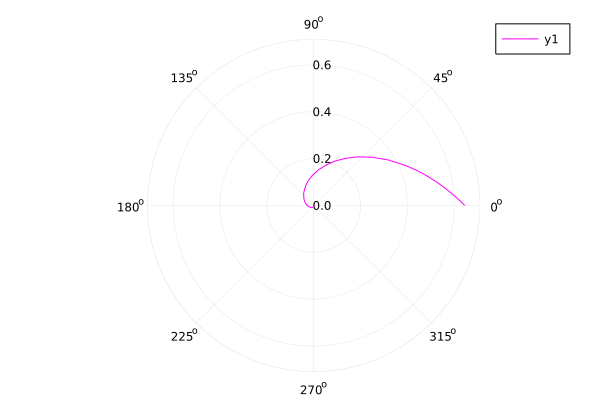

In [5]:
r(θ) = √2 * exp(-θ-π/4)
plot(θ -> r(θ), 0, 4π,
    proj = :polar, linecolor = :magenta)

### Prosta wizualizacja ruchu <a class="anchor" id="turtle"></a>

In [ ]:
function spider(angle, size)
    Drawing(2*size, 2*size)
    origin()
    box(0, 0, size, size, action=:none)
        for i in [[-size/2, -size/2, "cyan", 0], [size/2,-size/2, "yellow", 90],[size/2, size/2, "red", 180], [-size/2, size/2, "green", 270]]
            🐢 = Turtle()
            Penwidth(🐢, 1.5)
            Reposition(🐢, i[1], i[2])
            Turn(🐢, angle + i[4])
            z, n = size*sin(angle*π/180), size*cos(angle*π/180)
            Forward(🐢, n)
            for i in 1:Int(round(90/angle))
                Turn(🐢, 90 + angle)
                z, n = n*sin(angle*π/180), n*(1-sin(angle*π/180))*cos(angle*π/180)
                Forward(🐢, n)
            end
            🐢 = Turtle()
            Penwidth(🐢, 3)
            Pencolor(🐢, i[3])
            Reposition(🐢, i[1], i[2])
            Turn(🐢, angle + i[4])
            z, n = size*sin(angle*π/180), size*(1-sin(angle*π/180))*cos(angle*π/180)
            Forward(🐢, z)
            for i in 1:Int(round(90/angle))
                Turn(🐢, angle)
                z, n = n*sin(angle*π/180), n*(1-sin(angle*π/180))*cos(angle*π/180)
                Forward(🐢, z)
            end
        end
    finish()
end

W celu pokazania ruchu pająków, sprawdzimy o ile zmieniać będzie się kąt pomiędzy następnymi wektorami prędkości. Już w tym momencie możemy spodziewać się, że im większa będzie prędkość, z która swój ruch zaczną pająki, tym mniejszy kąt będzie dzielił kolejny styczne.<br>
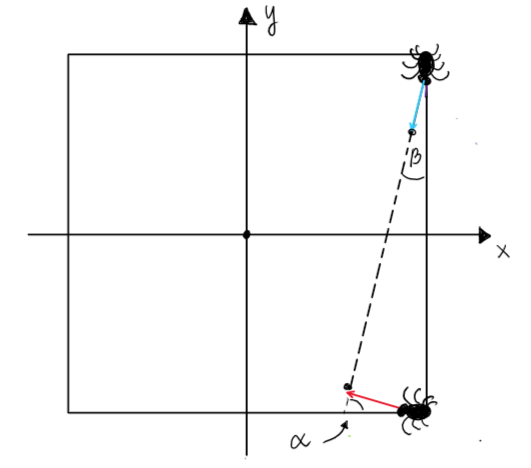<br>
Korzystająć z faktu, że współczynnik kierunkowej stycznej wyraża się wzorem $a = \frac{x + y}{x - y}$ i równocześnie jest równy tangesowi kąta $\alpha$ nachylenia owej prostej do osi $OX$, możemy wyprowadzić następującą zależność.
$$\tan{\alpha} = \frac{x + y}{x - y} $$
$$\alpha = \arctan{(\frac{x + y}{x - y})}$$
My jednak poruszamy się przeciwnie do ruchu wskazówek zegara, dlatego interesuje nas kąt przeciwny tj. $\beta = 90^o - \alpha$.

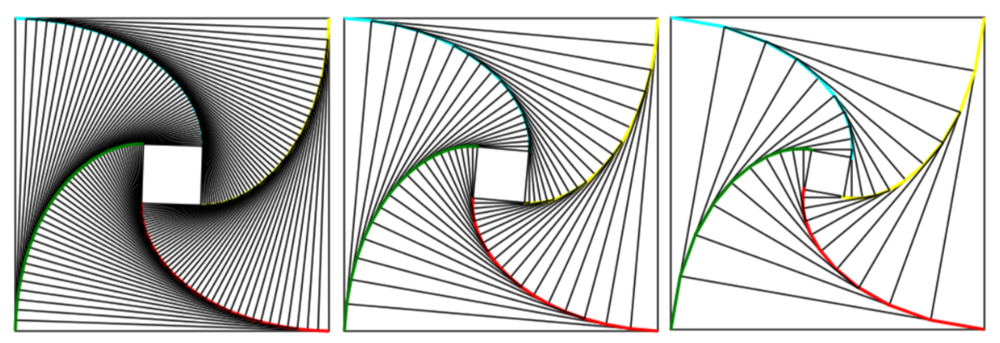<br>
<p style='text-align: center;'> Przybliżenie ruchu pająków dla kątów kolejno: $2^o, 5^o i 10^o$  </p>

# Co w przypadku, gdy kształt sufitu jest dowolną figurą foremną?<a class="anchor" id="miceall"></a>

Poruszony został problem ciągłego pościgu, w którym pewna liczba myszy (lub innych stworzeń, np. wyżej zdecydowaliśmy się na pająki) jest umieszczona w wierzchołkach wielokąta foremnego. Każdy z nich zaczyna poruszać się w kierunku swojego najbliższego sąsiada (przeciwnie lub zgodnie do ruchu wskazówek zegara). 

Z uwagi na rozpatrywane wielokąty foremne, będziemy rozpatrywać płaszczyznę zespoloną. Punkt $A = (x_{i}(t), y_{i}(t))$, $B = (x_{i+1}(t), y_{i+1}(t))$ i tak aż do $n-tego$ wierzchołka. Możemy skorzystać z [wcześniej wyprowadzonej zależności](#nie-prosta). <br>
<br>
$$\frac{dx_{i}}{dt}(t) = \frac{x_{i+1}(t) - x_{i}(t)}{\sqrt{(x_{i+1}(t) - x_{i}(t))^2 + (y_{i+1}(t) - y_{i}(t))^2}}$$<br>
Teraz wykorzytsując liczby zespolone, każdy punkt $(x_{k}(t), y_{k}(t))$ można zapisać jako $z_{k}(t) = x_{k}(t) + iy_{k}(t)$ <br>
<br>
$$ \frac{dz_{k}}{dt}(t) = \frac{z_{k+1}(t) - z_{k}(t)}{|z_{k+1}(t) - z_{k}(t)|} .$$<br>
Ze względu na stałość kątów pomiędzy następnymi wierzchołakami figury, współrzędne punktów możemy uzależnić od siebie poprzez obrót o odpowiedni kąt. Do tego przyda nam się postać wykładnicza liczby zespolonej. Dla *n-kąta* obrót wykonamy o kąt $\frac{2\pi}{n}$.
$$ z_{k+1}(t) = e^{\frac{2\pi}{n} i}z_{k}(t) $$
Wykorzystajmy to podstawienie.
$$ \begin{split}
\frac{dz_{k}}{dt}(t) &= \frac{e^{\frac{2\pi}{n} i}z_{k}(t) - z_{k}(t)}{|e^{\frac{2\pi}{n}i} - 1||z_{k}(t)|} = \frac{e^{\frac{2\pi}{n} i} - 1}{|e^{\frac{2\pi}{n} i} - 1|}\cdot\frac{z_{k}(t)}{|z_{k}(t)|} \\
 &= \frac{e^{\frac{\pi}{n} i}(e^{\frac{\pi}{n} i} - e^{-\frac{\pi}{n} i})}{|e^{\frac{\pi}{n}i} - e^{-\frac{\pi}{n} i}|}\cdot\frac{z_{k}(t)}{|z_{k}(t)|} \\ 
 &= \frac{e^{\frac{\pi}{n} i}(\cos{(\frac{\pi}{n})} + i\sin{(\frac{\pi}{n})} - \cos{(-\frac{\pi}{n})} - i\sin{(-\frac{\pi}{n})})}{|(\cos{(\frac{\pi}{n})} + i\sin{(\frac{\pi}{n})} - \cos{(-\frac{\pi}{n})} - i\sin{(-\frac{\pi}{n})})|}\cdot\frac{z_{k}(t)}{|z_{k}(t)|} \\
 &= \frac{e^{\frac{\pi}{n} i}2i\sin{(\frac{\pi}{n})}}{|2i\sin{(\frac{\pi}{n})}|}\cdot\frac{z_{k}(t)}{|z_{k}(t)|}
 = e^{\frac{\pi}{n} i}i\frac{z_{k}(t)}{|z_{k}(t)|} \\
 &= e^{\frac{\pi}{n} i} e^{\frac{\pi}{2} i} \frac{z_{k}(t)}{|z_{k}(t)|} = e^{(\frac{\pi}{n}i+\frac{\pi}{2}i)}\frac{z_{k}(t)}{|z_{k}(t)|}
\end{split} $$

Punkt można przekształcić na współrzędne biegunowe, korzystając z postaci trygonometrycznej liczby zespolonej $z(t) = r(t)e^{i\phi(t)}$ oraz jej pochodnej $z'(t) = r'(t)e^{i\phi(t)} + r(t)ie^{i\phi(t)}$. Wracając do powyższegio wyprowadzenia
<br>
$$\begin{align}
\frac{dz}{dt}(t) = \frac{dr}{dt}(t) e^{i\phi(t)} + ri\frac{d\phi}{dt}(t)e^{i\phi(t)} &= e^{(\frac{\pi}{n}i+\frac{\pi}{2}i)}\frac{r(t)e^{i\phi(t)}}{r(t)|e^{i\phi(t)}|} \\
\frac{dr}{dt}(t) e^{i\phi(t)} + ri\frac{d\phi}{dt}(t)e^{i\phi(t)} &= e^{(\frac{\pi}{n}i+\frac{\pi}{2}i)}\frac{e^{i\phi(t)}}{|\cos{\phi(t)} + i\sin{\phi(t)}|} \\
\frac{dr}{dt}(t) e^{i\phi(t)} + ri\frac{d\phi}{dt}(t)e^{i\phi(t)} &= e^{(\frac{\pi}{n}i+\frac{\pi}{2}i)}e^{i\phi(t)} \\
\frac{dr}{dt}(t) + ir\frac{d\phi}{dt}(t) &= e^{(\frac{\pi}{n}i+\frac{\pi}{2}i)} \phantom{---}(1)
\end{align}.$$<br>
Przyrównamy najpierw do siebie części rzeczywiste równania $(1)$, ponieważ widać, że jesteśmy w stanie wyznaczyć tym sposobem $r$.<br> <br>
 $$ \begin{split}
 \frac{dr}{dt}(t) &= \cos{(\frac{\pi}{n}+\frac{\pi}{2})} = -sin{\frac{\pi}{n}} \\
 \int \frac{dr}{dt}(t) &=  -\int \sin{\frac{\pi}{n}} \\
 r(t) &= -\sin{(\frac{\pi}{n})}\cdot t + C  
 \end{split}$$ <br>
 Wykorzystajmy teraz fakt, że dla każdego wielokąta ustalamy promień początkowy $r(0) = 1 \Rightarrow C = 1$ czyli<br>
 <br>
 $$ r(t) = 1 - \sin{(\frac{\pi}{n})}\cdot t .$$
 Następnie przyrównamy części urojone równania $(1)$.
 $$ \begin{split}
 r\frac{d\phi}{dt}(t) &= \sin{(\frac{\pi}{n}+\frac{\pi}{2})} = cos{\frac{\pi}{n}} \\
 \frac{d\phi}{dt}(t) &= \frac{cos{\frac{\pi}{n}}}{1 - \sin{(\frac{\pi}{n})}\cdot t} \\
 \phi(t) &= \int^{t}_{0}\frac{cos{\frac{\pi}{n}}}{1 - \sin{(\frac{\pi}{n})}\cdot s}ds \\
  \phi(t) &= \cos{\frac{\pi}{n}}\int^{t}_{0}\frac{1}{1 - \sin{(\frac{\pi}{n})}\cdot s}ds \\
 \phi(t) &= -\cot{(\frac{\pi}{n})}\ln{(1 - \sin{(\frac{\pi}{n})}\cdot t)} 
 \end{split}$$
Wewnątrz logarytmu pojawia się wcześniej wyprowadzone $r(t)$.
$$\begin{split}
\phi(t) &= -\cot{(\frac{\pi}{n})}\ln{(r(t))}t \\
\ln{(r(t))} &= -\tan{(\frac{\pi}{n})}\phi(t) \\
r(t) &= e^{-\tan{(\frac{\pi}{n})}\phi(t)}
\end{split}$$

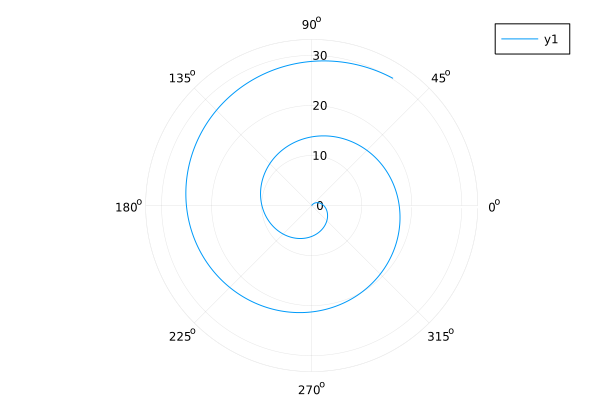

In [13]:
r(t) = 1 - sin(π/6)t
ϕ(t) = -cot(π/6)log(1 - sin(π/6))t
plot(r, ϕ, 0:0.01:8π, proj=:polar)

*Przykład dla ruchu wewnątrz sześciokąta - układ wspł. biegunowych.*

Uzależniając $r$ jedynie od $\phi$ otrzymujemy 
$$ r = e^{-\tan{(\frac{\pi}{n})}\phi} $$

W celu pokazania krzywej w układzie współrzędnych kartezjańskich, wykorzystamy funkcję znajdującą się w [dokumentacji Julii [12]](#bib).

In [8]:
plot_polar(r, a, b; kwargs...) = plot(t -> r(t)*cos(t), t -> r(t)*sin(t), a, b; kwargs...)

plot_polar (generic function with 1 method)

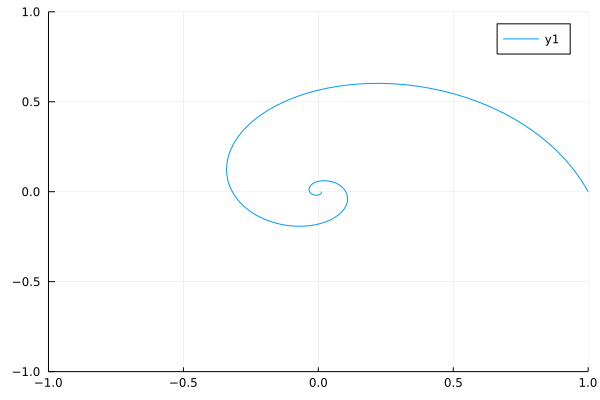

In [19]:
r(ϕ) = exp(-tan(π/9)ϕ)
plot_polar(r, 0, 4π,  xlim=(-1,1), ylim=(-1,1))

*Przykład spirali wewnątrz dziewięciokąta.*

### Porównanie wyniku zadania z wyprowadzeniem ogólnym <a class="anchor" id="por_oba"></a>

Chcielibyśmy sprawdzić, czy wyżej wyprowadzony wzór sprawdzi nam się dla zadania z pająkami $(n=4)$. Ponieważ w ogólności zaczynaliśmy ruch z osi $OX$, uzależnijmy tak też wcześniej znalezioną stałą $C$. Teraz za punkt początkowy naszej pogoni wybieramy punkt $(1, 0)$. Wracając do równania $ r(t) = -\sin{\frac{\pi}{n}}(t) + C $ otrzymujemy<br>
 <br>
$$ C = \arctan(0) - \ln(1) = 0 - 0 = 0.$$ <br>
Postępując po kolei, tak jak w przypadku wyżej, dochodzimy do równania postaci $ r = e^\phi $.

Rozważając oba powyższe wyprowadzenia dla ruchu wewnątrz kwadratu, otrzymaliśmy dwa równania. <br>
  <br>
$$ r = e^\phi $$
$$ r = e^{-\tan{(\frac{\pi}{4})}\phi} = e^{-\phi}$$ <br>
**Z czego wynika różnica w znaku potęgi?**<br>
W zadaniu z pająkami, założyliśmy ruch przeciwny do ruchu wskazówek zegara. Inaczej sytuacja wyglądała podczas rozwiązywania ogólnego zagadnienia - zdecydowaliśmy się na uzależnienie od siebie nastęnych wieczchołków, poprzez przesuwanie jednego o kąt $ \frac{\pi}{n}$ - ruch następował zgodnie z ruchem wskazówek zegara .

# Podsumowanie<a class="anchor" id="podsumowanie"></a>

# Bibliografia<a class="anchor" id="bib"></a>

[1] Polskie Towarzystwo Mechanik Teoretycznej i Stosowanej, MECHANIKA W LOTNICTWIE ML-IX (2000) [[link]](http://ptmts.org.pl/pliki/wydawnictwa/ML_IX_2000.pdf)<br>
[2] J. Barton and C. Eliezer. On pursuit curves. J. Austral. Math. Soc.
Ser. B, 41:358–371, (2000) [[link]](https://www.cambridge.org/core/services/aop-cambridge-core/content/view/8C87CB2301EE8DE3155A81C62BB5943E/S0334270000011292a.pdf/div-class-title-on-pursuit-curves-div.pdf) <br>
[3] The Mathematical Association: The Mathematical Gazette Vol. 37, No. 322 (Dec., 1953) [[link]](https://www.jstor.org/stable/3610038)<br>
[4] Bogdan, Mihai.Universitatii Maritime Constanta. Analele; Constanta Tom 10, Nr/wydanie 12, (2009) 
[[link]](https://www.proquest.com/openview/a057de780fdee8b94485d02cc0b3169d/1?pq-origsite=gscholar&cbl=60411)<br>
[5] L'ACADEMIE ROYALE DES SCIENCES, PARIS. Histoire de L'Academie Royale des Sciences. Année M.DCCXXXII. (1735) [[link]](https://www.biodiversitylibrary.org/item/87696#page/51/mode/1up) <br>
[6] https://www.cfm.brown.edu/people/dobrush/am33/Mathematica/ch2/pursuit.html <br>
[7] https://mse.redwoods.edu/darnold/math55/DEproj/sp08/mseverdia/pursuit.pdf <br>
[8] https://www.gotohaggstrom.com/Solving%20a%20basic%20pursuit%20curve%20problem%2029%20March%202014.pdf <br>
[9] https://mathcurve.com/courbes2d.gb/poursuite/poursuite.shtml <br>
[10] Icha A. Uogólnione krzywe pościgowe. Modelowanie Inżynierskie nr 62, (2017) [[link]](http://www.kms.polsl.pl/mi/pelne_31/05_31_62.pdf)<br>
[11] James Stewart, Single Variable Calculus: Early Transcendentals (8th Edition) [[link]](https://www.coursehero.com/textbook-solutions/four-bugs-are-placed-at-the-four-corners-of-a-square-with-side-length-a-the-bugs-crawl-9781305270336-44/Chapter-10-Problem-4-133237/) <br>
[12] https://docs.juliahub.com/CalculusWithJulia/AZHbv/0.0.5/differentiable_vector_calculus/polar_coordinates.html

https://www.youtube.com/watch?v=NdTVvWrD6r0 <br>